In [528]:
import os
import random
import shutil
import pandas as pd
import json
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB,  CategoricalNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [271]:
full_decoders_table = pd.read_csv('full_decoders_table.csv', index_col='Unnamed: 0')
full_decoders_table.head()

,Base64DetectorDecoder,Base32DetectorDecoder,Base16DetectorDecoder,CSVDetectorParser,DeflateUnpacker,DSVDetectorParser,FormUrlencodeParser,GraphQLDetectorParser,GzipUnpacker,JSONPDetectorParser,JSONDetectorParser,JsonRPCDetectorParser,UrlParser,XMLDetectorParser,YAMLDetectorParser,File,Path,Real_decoder
0,1.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['headers', 'content-type', 'parameters', 'cha...",0
1,0.0,1,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['url', 'scheme']",0
2,0.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['headers', 'user-agent']",0
3,0.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['url', 'netloc']",0
4,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,/waf/decoder-detector/new_samples/perekrestok_...,['dst_port'],0


In [272]:
columns = ['Base64DetectorDecoder',
           'Base32DetectorDecoder',
           'Base16DetectorDecoder',
           'CSVDetectorParser',
           'DeflateUnpacker',
           'DSVDetectorParser',
           'FormUrlencodeParser',
           'GraphQLDetectorParser',
           'GzipUnpacker',
           'JSONPDetectorParser',
           'JSONDetectorParser',
           'JsonRPCDetectorParser',
           'UrlParser',
           'XMLDetectorParser',
           'YAMLDetectorParser', 
           'File',
           'Path',
           'Real_decoder']

data_columns = ['Base64DetectorDecoder',
           'Base32DetectorDecoder',
           'Base16DetectorDecoder',
           'CSVDetectorParser',
           'DeflateUnpacker',
           'DSVDetectorParser',
           'FormUrlencodeParser',
           'GraphQLDetectorParser',
           'GzipUnpacker',
           'JSONPDetectorParser',
           'JSONDetectorParser',
           'JsonRPCDetectorParser',
           'UrlParser',
           'XMLDetectorParser',
           'YAMLDetectorParser', 
           'File',
           'Path']
decoder_columns = ['Base64DetectorDecoder',
           'Base32DetectorDecoder',
           'Base16DetectorDecoder',
           'CSVDetectorParser',
           'DeflateUnpacker',
           'DSVDetectorParser',
           'FormUrlencodeParser',
           'GraphQLDetectorParser',
           'GzipUnpacker',
           'JSONPDetectorParser',
           'JSONDetectorParser',
           'JsonRPCDetectorParser',
           'UrlParser',
           'XMLDetectorParser',
           'YAMLDetectorParser']

In [325]:
full_decoders_table = full_decoders_table[columns]
full_decoders_table['Real_decoder'].value_counts()

0     805526
7       7081
11      6399
8       4587
1        349
Name: Real_decoder, dtype: int64

In [442]:
NULLS_LEF = 15000

In [328]:
full_decoders_table['Real_decoder'].value_counts()

0     805526
7       7081
11      6399
8       4587
1        349
Name: Real_decoder, dtype: int64

In [338]:
copy_full_decoders = full_decoders_table
copy_full_decoders['Real_decoder'].value_counts()

0     805526
7       7081
11      6399
8       4587
1        349
Name: Real_decoder, dtype: int64

In [341]:
a_full_decoders_table = copy_full_decoders.loc[copy_full_decoders['Real_decoder'] != 0]
a_full_decoders_table['Real_decoder'].value_counts()

7     7081
11    6399
8     4587
1      349
Name: Real_decoder, dtype: int64

In [342]:
null_decoders_table = full_decoders_table.drop(full_decoders_table[full_decoders_table['Real_decoder'] != 0].index)
null_decoders_table['Real_decoder'].shape

(790947,)

In [343]:
null_decoders_table.head()

,Base64DetectorDecoder,Base32DetectorDecoder,Base16DetectorDecoder,CSVDetectorParser,DeflateUnpacker,DSVDetectorParser,FormUrlencodeParser,GraphQLDetectorParser,GzipUnpacker,JSONPDetectorParser,JSONDetectorParser,JsonRPCDetectorParser,UrlParser,XMLDetectorParser,YAMLDetectorParser,File,Path,Real_decoder
1,0.0,1,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['url', 'scheme']",0
2,0.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['headers', 'user-agent']",0
3,0.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['url', 'netloc']",0
4,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,/waf/decoder-detector/new_samples/perekrestok_...,['dst_port'],0
5,0.0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,/waf/decoder-detector/new_samples/perekrestok_...,"['url', 'query', 'transport']",0


In [443]:
random.seed(42)
shape_len = null_decoders_table['Real_decoder'].shape[0] - 1
print(shape_len)
new_null_decoders_table = pd.DataFrame()
for i in range(NULLS_LEF):
    df = null_decoders_table.iloc[[random.choice(range(0, shape_len))]]
    print(df)
    new_null_decoders_table = pd.concat([new_null_decoders_table, df])

790946
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
432664                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
432664                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
432664                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
432664                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
432664          1                  0                   1   

                                                     File  \
432664  /waf/decoder-detector/new_samples/mvideo/train...   

                                                  Path  Real_decoder  
432664  ['body', 'mouse', 'movegen', 'data', '5', 'd']             0  
        Base64DetectorDecoder  

37295             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
7567                    1.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
7567                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
7567                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
7567                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
7567          1                  0                   1   

                                                   File  \
7567  /waf/decoder-detector/new_samples/teachercente...   

                                     Path  Real_decoder  
7567  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
77973                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
77973                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
77973                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
77973                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
77973          1                  0                   1   

                                                    File  \
77973  /waf/decoder-detector/new_samples/ozon_json_js...   

                                Path  Real_decoder  
77973  ['headers', 'content-length']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
51421   

433281  ['body', 'events', '7', 'context', 'lastActivi...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
484741                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
484741                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
484741                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
484741                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
484741          1                  0                   1   

                                                     File        Path  \
484741  /waf/decoder-detector/new_samples/graphql_nyti...  ['src_ip']   

        Real_decoder  
484741             0  
        Base64DetectorDecoder  Base3

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
373911                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
373911                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
373911                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
373911                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
373911          1                  0                   1   

                                                     File  \
373911  /waf/decoder-detector/new_samples/railware_bas...   

                                 Path  Real_decoder  
373911  ['headers', 'cookie', '_gid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

128312  ['headers', 'cookie', '__exponea_etc__']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
477784                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
477784                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
477784                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
477784                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
477784          1                  0                   0   

                                                     File  \
477784  /waf/decoder-detector/new_samples/mvideo/train...   

                         Path  Real_decoder  
477784  ['headers', 'accept']             0  
        Base64DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
88459                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
88459                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
88459                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
88459                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
88459          1                  0                   1   

                                                    File  \
88459  /waf/decoder-detector/new_samples/foodband/tes...   

                            Path  Real_decoder  
88459  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
271199         

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
467055                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
467055                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
467055                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
467055                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
467055          1                  0                   1   

                                                     File  \
467055  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
467055  ['body', 'events', '49', 'context', 'lastActiv...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
325368                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
325368                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
325368                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
325368                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
325368          1                  0                   1   

                                                     File  \
325368  /waf/decoder-detector/new_samples/beru_json_js...   

                             Path  Real_decoder  
325368  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1

122416  ['headers', 'sec-fetch-dest']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
4500                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
4500                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
4500                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
4500                    0                   1                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
4500          1                  0                   1   

                                                   File  \
4500  /waf/decoder-detector/new_samples/youtube/trai...   

                                                   Path  Real_decoder  
4500  ['body', 'events', '61', 'context', 'lastActiv...             0  
      

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
149413                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
149413                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
149413                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
149413                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
149413          1                  0                   1   

                                                     File  \
149413  /waf/decoder-detector/new_samples/graphql_cour...   

                          Path  Real_decoder  
149413  ['headers', 'referer']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
2531     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
176265                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
176265                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
176265                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
176265                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
176265          0                  0                   0   

                                                     File          Path  \
176265  /waf/decoder-detector/new_samples/graphql_nyti...  ['protocol']   

        Real_decoder  
176265             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
63791                    1.0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
146539                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
146539                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
146539                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
146539                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
146539          1                  0                   1   

                                                     File               Path  \
146539  /waf/decoder-detector/new_samples/mvideo/train...  ['url', 'scheme']   

        Real_decoder  
146539             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
467059           

448180  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
314289                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
314289                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
314289                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
314289                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
314289          0                  0                   0   

                                                     File  \
314289  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
314289  ['body', 'params', '0', 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
198970                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
198970                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
198970                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
198970                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
198970          0                  0                   0   

                                                     File  \
198970  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
198970  ['body', 'params', '0', 'offerList', '0', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
133461                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
133461                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
133461                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
133461                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
133461          1                  0                   1   

                                                     File  \
133461  /waf/decoder-detector/new_samples/ozon_json_js...   

                                         Path  Real_decoder  
133461  ['headers', 'cookie', 'nlbi_1101384']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Bas

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
248900                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
248900                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
248900                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
248900                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
248900          0                  0                   0   

                                                     File          Path  \
248900  /waf/decoder-detector/new_samples/rambler/trai...  ['protocol']   

        Real_decoder  
248900             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
223313                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
527905                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
527905                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
527905                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
527905                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
527905          0                  0                   0   

                                                     File  \
527905  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
527905  ['body', 'params', '0', 'offerList', '1', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
139559                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
139559                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
139559                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
139559                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
139559          1                  0                   1   

                                                     File  \
139559  /waf/decoder-detector/new_samples/graphql_jobs...   

                        Path  Real_decoder  
139559  ['url', 'path', '1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
518490     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
368993                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
368993                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
368993                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
368993                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
368993          1                  0                   1   

                                                     File  \
368993  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
368993  ['body', 'params', '0', 'offerList', '1', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
81629                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
81629                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
81629                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
81629                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
81629          0                  0                   0   

                                                    File          Path  \
81629  /waf/decoder-detector/new_samples/mvideo/train...  ['src_port']   

       Real_decoder  
81629             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
234292                    1.0            

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
462633                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
462633                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
462633                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
462633                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
462633          0                  0                   0   

                                                     File          Path  \
462633  /waf/decoder-detector/new_samples/graphql_stak...  ['src_port']   

        Real_decoder  
462633             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
316653                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
511827                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
511827                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
511827                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
511827                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
511827          1                  0                   1   

                                                     File  \
511827  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
511827  ['body', 'params', '0', 'collections', 'cartIt...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
22096                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
22096                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
22096                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
22096                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
22096          1                  0                   1   

                                                    File        Path  \
22096  /waf/decoder-detector/new_samples/graphql_jobs...  ['method']   

       Real_decoder  
22096             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
364426                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
184743                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
184743                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
184743                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
184743                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
184743          1                  0                   1   

                                                     File        Path  \
184743  /waf/decoder-detector/new_samples/teachercente...  ['dst_ip']   

        Real_decoder  
184743             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
247658                    1.0  

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
21928                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
21928                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
21928                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
21928                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
21928          1                  0                   1   

                                                    File  \
21928  /waf/decoder-detector/new_samples/graphql_cour...   

                                Path  Real_decoder  
21928  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
549843 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
548670                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
548670                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
548670                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
548670                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
548670          0                  0                   0   

                                                     File  \
548670  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
548670  ['body', 'params', '0', 'offerList', '11', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
204241                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
204241                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
204241                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
204241                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
204241          1                  0                   1   

                                                     File               Path  \
204241  /waf/decoder-detector/new_samples/foodband/tra...  ['url', 'netloc']   

        Real_decoder  
204241             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
456198           

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
86386                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
86386                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
86386                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
86386                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
86386          0                  0                   0   

                                                    File  \
86386  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                    Path  Real_decoder  
86386  ['body', 'targeting', 'passengers', 'adult_cou...             0  
     Base64DetectorDecoder  Base32DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
343125                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
343125                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
343125                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
343125                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
343125          1                  0                   1   

                                                     File  \
343125  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
343125  ['body', 'events', '67', 'context', 'lastActiv...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
546583                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
546583                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
546583                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
546583                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
546583          0                  0                   0   

                                                     File  \
546583  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
546583  ['body', 'params', '0', 'offerList', '7', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129279                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
129279                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
129279                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
129279                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
129279          1                  0                   1   

                                                     File  \
129279  /waf/decoder-detector/new_samples/ozon_json_js...   

                                     Path  Real_decoder  
129279  ['headers', 'cookie', 'tmr_lvid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
259165                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
259165                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
259165                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
259165                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
259165          1                  0                   1   

                                                     File  \
259165  /waf/decoder-detector/new_samples/mvideo/test/...   

                          Path  Real_decoder  
259165  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
127795 

220215  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
58615                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
58615                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
58615                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
58615                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
58615          1                  0                   1   

                                                    File  \
58615  /waf/decoder-detector/new_samples/graphql_nyti...   

                                      Path  Real_decoder  
58615  ['headers', 'content-type', 'type']             0  
        Base64Detect

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
36674                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
36674                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
36674                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
36674                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
36674          1                  0                   1   

                                                    File  \
36674  /waf/decoder-detector/new_samples/foodband/tra...   

                           Path  Real_decoder  
36674  ['url', 'query', 'call']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
258993           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
216249                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
216249                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
216249                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
216249                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
216249          0                  0                   0   

                                                     File          Path  \
216249  /waf/decoder-detector/new_samples/beru_json_js...  ['src_port']   

        Real_decoder  
216249             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
139253                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
45174                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
45174                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
45174                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
45174                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
45174          1                  0                   1   

                                                    File  \
45174  /waf/decoder-detector/new_samples/graphql_nyti...   

                                Path  Real_decoder  
45174  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
196080 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
41215                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
41215                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
41215                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
41215                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
41215          1                  0                   1   

                                                    File  \
41215  /waf/decoder-detector/new_samples/graphql_jobs...   

                                      Path  Real_decoder  
41215  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
495457                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
495457                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
495457                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
495457                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
495457          0                  0                   0   

                                                     File  \
495457  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
495457  ['body', 'params', '0', 'offerList', '9', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
272647                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
272647                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
272647                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
272647                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
272647          1                  0                   1   

                                                     File  \
272647  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
272647  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
266528                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
266528                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
266528                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
266528                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
266528          1                  0                   1   

                                                     File  \
266528  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
266528  ['body', 'events', '116', 'visualElementGestur...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
379906                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
379906                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
379906                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
379906                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
379906          0                  0                   0   

                                                     File  \
379906  /waf/decoder-detector/new_samples/mvideo/train...   

                                                  Path  Real_decoder  
379906  ['body', 'mouse', 'movegen', 'data', '1', 'x']             0  
       Base64DetectorDecoder  Base32De

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
40316                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
40316                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
40316                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
40316                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
40316          1                  0                   1   

                                                    File  \
40316  /waf/decoder-detector/new_samples/foodband/tra...   

                                  Path  Real_decoder  
40316  ['headers', 'x-requested-with']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
409

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
144757                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
144757                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
144757                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
144757                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
144757          0                  0                   0   

                                                     File  \
144757  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
144757  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
259799                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
259799                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
259799                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
259799                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
259799          1                  0                   1   

                                                     File  \
259799  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
259799  ['headers', 'cookie', '__sonar']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
155791                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
155791                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
155791                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
155791                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
155791          1                  0                   1   

                                                     File  \
155791  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
155791  ['body', 'targeting', 'origin', 'country', 'lo...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
257480                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
257480                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
257480                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
257480                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
257480          1                  0                   1   

                                                     File  \
257480  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
257480  ['headers', 'cookie', '_gid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
224688                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
224688                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
224688                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
224688                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
224688          1                  0                   1   

                                                     File  \
224688  /waf/decoder-detector/new_samples/ozon_json_js...   

                                       Path  Real_decoder  
224688  ['headers', 'cookie', 'tmr_detect']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
138399                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
138399                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
138399                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
138399                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
138399          1                  0                   1   

                                                     File        Path  \
138399  /waf/decoder-detector/new_samples/graphql_cour...  ['dst_ip']   

        Real_decoder  
138399             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
233590                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
130661                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
130661                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
130661                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
130661                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
130661          1                  0                   1   

                                                     File  \
130661  /waf/decoder-detector/new_samples/mvideo/test/...   

                          Path  Real_decoder  
130661  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
156550 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
487000                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
487000                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
487000                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
487000                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
487000          1                  0                   1   

                                                     File  \
487000  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
487000  ['body', 'events', '48', 'latencyActionTicked'...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
24124                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
24124                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
24124                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
24124                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
24124          1                  0                   1   

                                                    File  \
24124  /waf/decoder-detector/new_samples/skyscanner_j...   

                                     Path  Real_decoder  
24124  ['headers', 'x-skyscanner-viewid']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
126366                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
126366                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
126366                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
126366                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
126366          1                  0                   1   

                                                     File  \
126366  /waf/decoder-detector/new_samples/graphql_stak...   

                               Path  Real_decoder  
126366  ['headers', 'x-csrf-token']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
436863                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
436863                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
436863                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
436863                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
436863          1                  0                   1   

                                                     File  \
436863  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
436863  ['body', 'targeting', 'origin', 'airport', 'lo...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
206252                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
206252                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
206252                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
206252                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
206252          1                  0                   1   

                                                     File  \
206252  /waf/decoder-detector/new_samples/rambler/trai...   

                                 Path  Real_decoder  
206252  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
208117                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
208117                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
208117                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
208117                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
208117          1                  0                   1   

                                                     File  \
208117  /waf/decoder-detector/new_samples/graphql_cour...   

                                                Path  Real_decoder  
208117  ['headers', 'cookie', '_hjIncludedInSample']             0  
        Base64DetectorDecoder  Base32Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
451074                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
451074                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
451074                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
451074                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
451074          0                  0                   0   

                                                     File  \
451074  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
451074  ['body', 'params', '0', 'offerList', '35', 'of...             0  
        Base64DetectorDecoder  B

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
7128                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
7128                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
7128                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
7128                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
7128          1                  0                   1   

                                                   File               Path  \
7128  /waf/decoder-detector/new_samples/graphql_stak...  ['url', 'scheme']   

      Real_decoder  
7128             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
202973                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
409560                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
409560                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
409560                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
409560                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
409560          1                  0                   1   

                                                     File  \
409560  /waf/decoder-detector/new_samples/rambler/test...   

                         Path  Real_decoder  
409560  ['headers', 'origin']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
55838     

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
8877                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
8877                  0                0                  0   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
8877                    0                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
8877                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
8877          0                  0                   0   

                                                   File          Path  \
8877  /waf/decoder-detector/new_samples/graphql_stak...  ['dst_port']   

      Real_decoder  
8877             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
228730                    0.0                      1   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
76066                    0.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
76066                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
76066                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
76066                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
76066          1                  0                   1   

                                                    File  \
76066  /waf/decoder-detector/new_samples/youtube/test...   

                                                    Path  Real_decoder  
76066  ['body', 'events', '7', 'context', 'lastActivi...             0  
        Base64DetectorDecoder  Base32DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
88168                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
88168                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
88168                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
88168                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
88168          1                  0                   1   

                                                    File        Path  \
88168  /waf/decoder-detector/new_samples/perekrestok_...  ['dst_ip']   

       Real_decoder  
88168             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
168103                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
220741                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
220741                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
220741                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
220741                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
220741          1                  0                   1   

                                                     File  \
220741  /waf/decoder-detector/new_samples/beru_json_js...   

                                               Path  Real_decoder  
220741  ['headers', 'cookie', 'available-delivery']             0  
        Base64DetectorDecoder  Base32Detecto

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
33406                    0.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
33406                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
33406                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
33406                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
33406          1                  0                   1   

                                                    File  \
33406  /waf/decoder-detector/new_samples/mvideo/test/...   

                                           Path  Real_decoder  
33406  ['body', 'variables', 'productIds', '4']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
284902                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
284902                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
284902                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
284902                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
284902          0                  0                   0   

                                                     File  \
284902  /waf/decoder-detector/new_samples/youtube/trai...   

                                           Path  Real_decoder  
284902  ['body', 'events', '64', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

388134  ['headers', 'nyt-app-version']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
58736                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
58736                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
58736                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
58736                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
58736          1                  0                   1   

                                                    File  \
58736  /waf/decoder-detector/new_samples/graphql_stak...   

                            Path  Real_decoder  
58736  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32De

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
72204                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
72204                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
72204                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
72204                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
72204          1                  0                   1   

                                                    File  \
72204  /waf/decoder-detector/new_samples/skyscanner_j...   

                        Path  Real_decoder  
72204  ['headers', 'origin']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
346502                 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
113344                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
113344                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
113344                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
113344                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
113344          1                  0                   1   

                                                     File  \
113344  /waf/decoder-detector/new_samples/perekrestok_...   

                                                     Path  Real_decoder  
113344  ['headers', 'content-type', 'parameters', 'cha...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
261836                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
261836                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
261836                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
261836                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
261836          1                  0                   1   

                                                     File  \
261836  /waf/decoder-detector/new_samples/graphql_nyti...   

                               Path  Real_decoder  
261836  ['headers', 'nyt-app-type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
179465                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
179465                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
179465                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
179465                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
179465          0                  0                   0   

                                                     File          Path  \
179465  /waf/decoder-detector/new_samples/foodband/tra...  ['protocol']   

        Real_decoder  
179465             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
31304                    0.0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
46992                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
46992                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
46992                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
46992                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
46992          0                  0                   0   

                                                    File  \
46992  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
46992  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
236207                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
236207                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
236207                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
236207                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
236207          1                  0                   1   

                                                     File  \
236207  /waf/decoder-detector/new_samples/beru_json_js...   

                        Path  Real_decoder  
236207  ['url', 'path', '1']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
70414       

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
75851                    1.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
75851                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
75851                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
75851                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
75851          1                  0                   1   

                                                    File  \
75851  /waf/decoder-detector/new_samples/graphql_cour...   

                                Path  Real_decoder  
75851  ['headers', 'r2-app-version']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
311268 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
332668                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
332668                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
332668                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
332668                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
332668          1                  0                   1   

                                                     File  \
332668  /waf/decoder-detector/new_samples/rambler/trai...   

                                Path  Real_decoder  
332668  ['headers', 'cookie', 'dvr']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
46133                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
46133                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
46133                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
46133                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
46133          0                  0                   0   

                                                    File  \
46133  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
46133  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
114966                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
114966                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
114966                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
114966                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
114966          1                  0                   1   

                                                     File  \
114966  /waf/decoder-detector/new_samples/rambler/trai...   

                                 Path  Real_decoder  
114966  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

     Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
609                    0.0                      1                      0   

     CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
609                  1                0                  1   

     FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
609                    1                      0             0   

     JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
609                    0                   0                      0   

     UrlParser  XMLDetectorParser  YAMLDetectorParser  \
609          1                  0                   1   

                                                  File                  Path  \
609  /waf/decoder-detector/new_samples/perekrestok_...  ['url', 'path', '0']   

     Real_decoder  
609             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
475296                    0.0                      0 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
362563                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
362563                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
362563                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
362563                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
362563          1                  0                   1   

                                                     File        Path  \
362563  /waf/decoder-detector/new_samples/graphql_jobs...  ['dst_ip']   

        Real_decoder  
362563             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
154193                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
230542                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
230542                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
230542                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
230542                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
230542          0                  0                   0   

                                                     File  \
230542  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
230542  ['body', 'params', '0', 'offerList', '4', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
29602                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
29602                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
29602                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
29602                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
29602          1                  0                   1   

                                                    File  \
29602  /waf/decoder-detector/new_samples/skyscanner_j...   

                            Path  Real_decoder  
29602  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129297         

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
143687                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
143687                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
143687                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
143687                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
143687          1                  0                   1   

                                                     File               Path  \
143687  /waf/decoder-detector/new_samples/rambler/trai...  ['url', 'netloc']   

        Real_decoder  
143687             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
338338           

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
64695                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
64695                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
64695                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
64695                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
64695          1                  0                   1   

                                                    File  \
64695  /waf/decoder-detector/new_samples/teachercente...   

                       Path  Real_decoder  
64695  ['url', 'path', '2']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
405920                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
409852                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
409852                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
409852                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
409852                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
409852          1                  0                   1   

                                                     File  \
409852  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
409852  ['body', 'params', '1', 'carts', '0', 'items',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
171377                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
171377                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
171377                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
171377                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
171377          0                  0                   0   

                                                     File  \
171377  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
171377  ['body', 'params', '1', 'carts', '0', 'items',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
282142                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
282142                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
282142                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
282142                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
282142          0                  0                   0   

                                                     File  \
282142  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
282142  ['body', 'params', '0', 'offerList', '8', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
526788                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
526788                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
526788                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
526788                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
526788          0                  0                   0   

                                                     File  \
526788  /waf/decoder-detector/new_samples/skyscanner_j...   

                                     Path  Real_decoder  
526788  ['body', 'targeting', 'duration']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
105078                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
105078                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
105078                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
105078                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
105078          1                  0                   1   

                                                     File  \
105078  /waf/decoder-detector/new_samples/ozon_json_js...   

                                              Path  Real_decoder  
105078  ['headers', 'cookie', '__exponea_time2__']             0  
        Base64DetectorDecoder  Base32DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
60719                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
60719                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
60719                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
60719                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
60719          1                  0                   1   

                                                    File  \
60719  /waf/decoder-detector/new_samples/youtube/trai...   

                                Path  Real_decoder  
60719  ['headers', 'sec-fetch-site']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
383704 

57594  ['headers', 'accept-encoding']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
372775                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
372775                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
372775                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
372775                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
372775          1                  0                   1   

                                                     File  \
372775  /waf/decoder-detector/new_samples/mvideo/train...   

                       Path  Real_decoder  
372775  ['body', 'cookies']             0  
        Base64DetectorDecoder  Base32D

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
252391                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
252391                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
252391                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
252391                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
252391          0                  0                   0   

                                                     File  \
252391  /waf/decoder-detector/new_samples/youtube/trai...   

                                           Path  Real_decoder  
252391  ['body', 'events', '41', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
490236                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
490236                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
490236                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
490236                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
490236          1                  0                   1   

                                                     File  \
490236  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
490236  ['body', 'events', '84', 'visualElementShown',...             0  
       Base64DetectorDecoder  Ba

48005  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
136464                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
136464                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
136464                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
136464                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
136464          1                  0                   1   

                                                     File               Path  \
136464  /waf/decoder-detector/new_samples/ozon_json_js...  ['url', 'scheme']   

        Real_decoder  
136464             0  
        Base64DetectorDecoder  Base32Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
493277                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
493277                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
493277                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
493277                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
493277          1                  0                   1   

                                                     File  \
493277  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
493277  ['body', 'params', '0', 'offerList', '6', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
337331                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
337331                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
337331                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
337331                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
337331          0                  0                   0   

                                                     File  \
337331  /waf/decoder-detector/new_samples/mvideo/train...   

                                               Path  Real_decoder  
337331  ['body', 'mouse', 'move', 'data', '1', 't']             0  
        Base64DetectorDecoder  Base32Detecto

169461             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
278568                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
278568                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
278568                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
278568                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
278568          1                  0                   0   

                                                     File  \
278568  /waf/decoder-detector/new_samples/mvideo/train...   

                         Path  Real_decoder  
278568  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detec

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
14068                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
14068                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
14068                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
14068                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
14068          1                  0                   1   

                                                    File  \
14068  /waf/decoder-detector/new_samples/graphql_cour...   

                                                 Path  Real_decoder  
14068  ['headers', 'cookie', '_dc_gtm_UA-86370891-1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
3800                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
3800                  0                0                  0   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
3800                    0                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
3800                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
3800          0                  0                   0   

                                                   File  \
3800  /waf/decoder-detector/new_samples/youtube/test...   

                                         Path  Real_decoder  
3800  ['body', 'events', '81', 'eventTimeMs']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
793

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
482518                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
482518                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
482518                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
482518                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
482518          1                  0                   1   

                                                     File  \
482518  /waf/decoder-detector/new_samples/graphql_nyti...   

                                   Path  Real_decoder  
482518  ['headers', 'cookie', 'walley']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
385922                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
385922                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
385922                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
385922                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
385922          1                  0                   1   

                                                     File  \
385922  /waf/decoder-detector/new_samples/mvideo/test/...   

                                            Path  Real_decoder  
385922  ['body', 'variables', 'productIds', '1']             0  
       Base64DetectorDecoder  Base32DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
372373                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
372373                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
372373                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
372373                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
372373          1                  0                   1   

                                                     File  \
372373  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
372373  ['body', 'events', '18', 'context', 'lastActiv...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
367238                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
367238                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
367238                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
367238                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
367238          0                  0                   0   

                                                     File  \
367238  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
367238  ['body', 'params', '0', 'offerList', '6', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
456482                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
456482                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
456482                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
456482                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
456482          0                  0                   0   

                                                     File  \
456482  /waf/decoder-detector/new_samples/youtube/trai...   

                                           Path  Real_decoder  
456482  ['body', 'events', '36', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
210893                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
210893                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
210893                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
210893                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
210893          0                  0                   0   

                                                     File          Path  \
210893  /waf/decoder-detector/new_samples/mvideo/train...  ['src_port']   

        Real_decoder  
210893             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
524100                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
287595                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
287595                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
287595                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
287595                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
287595          1                  0                   1   

                                                     File  \
287595  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
287595  ['headers', 'r2-app-version']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
474594                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
474594                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
474594                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
474594                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
474594          0                  0                   0   

                                                     File  \
474594  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
474594  ['body', 'targeting', 'search_start_timestamp'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
350205                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
350205                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
350205                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
350205                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
350205          1                  0                   1   

                                                     File  \
350205  /waf/decoder-detector/new_samples/graphql_cour...   

                          Path  Real_decoder  
350205  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
186856 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
81579                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
81579                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
81579                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
81579                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
81579          1                  0                   1   

                                                    File        Path  \
81579  /waf/decoder-detector/new_samples/graphql_cour...  ['src_ip']   

       Real_decoder  
81579             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
210541                    1.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
151302                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
151302                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
151302                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
151302                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
151302          1                  0                   1   

                                                     File  \
151302  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                Path  Real_decoder  
151302  ['body', 'id_placements', 'adslot-091ff156']             0  
        Base64DetectorDecoder  Base32Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
541533                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
541533                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
541533                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
541533                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
541533          1                  0                   1   

                                                     File  \
541533  /waf/decoder-detector/new_samples/teachercente...   

                                       Path  Real_decoder  
541533  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
103372                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
103372                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
103372                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
103372                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
103372          1                  0                   1   

                                                     File  \
103372  /waf/decoder-detector/new_samples/skyscanner_j...   

                                             Path  Real_decoder  
103372  ['body', 'id_placements', 'pqs-house-ad']             0  
       Base64DetectorDecoder  Base32DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
463327                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
463327                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
463327                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
463327                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
463327          1                  0                   1   

                                                     File        Path  \
463327  /waf/decoder-detector/new_samples/youtube/trai...  ['method']   

        Real_decoder  
463327             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
54434                    1.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
185367                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
185367                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
185367                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
185367                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
185367          1                  0                   1   

                                                     File  \
185367  /waf/decoder-detector/new_samples/rambler/test...   

                                Path  Real_decoder  
185367  ['headers', 'cookie', 'lvr']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
494394                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
494394                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
494394                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
494394                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
494394          0                  0                   0   

                                                     File  \
494394  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
494394  ['body', 'params', '0', 'offerList', '13', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
256704                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
256704                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
256704                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
256704                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
256704          1                  0                   1   

                                                     File  \
256704  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
256704  ['body', 'events', '104', 'latencyActionTicked...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
154847                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
154847                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
154847                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
154847                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
154847          1                  0                   1   

                                                     File  \
154847  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
154847  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
123684                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
123684                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
123684                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
123684                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
123684          1                  0                   1   

                                                     File  \
123684  /waf/decoder-detector/new_samples/graphql_nyti...   

                        Path  Real_decoder  
123684  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
340187     

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
70742                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
70742                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
70742                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
70742                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
70742          1                  0                   1   

                                                    File  \
70742  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
70742  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
188104                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
188104                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
188104                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
188104                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
188104          1                  0                   1   

                                                     File  \
188104  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
188104  ['headers', 'cookie', 'abGroup']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
519703                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
519703                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
519703                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
519703                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
519703          1                  0                   1   

                                                     File  \
519703  /waf/decoder-detector/new_samples/foodband/tra...   

                                 Path  Real_decoder  
519703  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
445098                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
445098                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
445098                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
445098                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
445098          0                  0                   0   

                                                     File  \
445098  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
445098  ['body', 'params', '0', 'offerList', '1', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
39639                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
39639                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
39639                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
39639                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
39639          1                  0                   1   

                                                    File               Path  \
39639  /waf/decoder-detector/new_samples/teachercente...  ['url', 'scheme']   

       Real_decoder  
39639             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
164975                    1.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
155874                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
155874                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
155874                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
155874                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
155874          1                  0                   1   

                                                     File  \
155874  /waf/decoder-detector/new_samples/youtube/trai...   

                          Path  Real_decoder  
155874  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
426126 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
322846                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
322846                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
322846                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
322846                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
322846          0                  0                   0   

                                                     File  \
322846  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
322846  ['body', 'params', '0', 'carts', '0', 'brokenD...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
248417                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
248417                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
248417                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
248417                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
248417          1                  0                   1   

                                                     File  \
248417  /waf/decoder-detector/new_samples/beru_json_js...   

                                  Path  Real_decoder  
248417  ['headers', 'accept-encoding']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
529638                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
529638                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
529638                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
529638                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
529638          1                  0                   1   

                                                     File  \
529638  /waf/decoder-detector/new_samples/youtube/test...   

                                 Path  Real_decoder  
529638  ['headers', 'sec-fetch-mode']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
441818                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
441818                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
441818                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
441818                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
441818          1                  0                   1   

                                                     File        Path  \
441818  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_ip']   

        Real_decoder  
441818             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
122525                    0.0  

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
5225                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
5225                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
5225                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
5225                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
5225          1                  0                   1   

                                                   File               Path  \
5225  /waf/decoder-detector/new_samples/rambler/trai...  ['url', 'scheme']   

      Real_decoder  
5225             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
502406                    1.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
402535                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
402535                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
402535                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
402535                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
402535          1                  0                   1   

                                                     File        Path  \
402535  /waf/decoder-detector/new_samples/perekrestok_...  ['src_ip']   

        Real_decoder  
402535             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
164545                    1.0  

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
67512                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
67512                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
67512                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
67512                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
67512          0                  0                   0   

                                                    File  \
67512  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
67512  ['body', 'events', '115', 'visualElementGestur...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
438919                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
438919                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
438919                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
438919                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
438919          1                  0                   1   

                                                     File        Path  \
438919  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_ip']   

        Real_decoder  
438919             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
193880                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
190107                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
190107                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
190107                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
190107                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
190107          0                  0                   0   

                                                     File  \
190107  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
190107  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
135900                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
135900                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
135900                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
135900                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
135900          1                  0                   1   

                                                     File        Path  \
135900  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_ip']   

        Real_decoder  
135900             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
328400                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
508851                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
508851                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
508851                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
508851                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
508851          1                  0                   1   

                                                     File               Path  \
508851  /waf/decoder-detector/new_samples/youtube/trai...  ['url', 'scheme']   

        Real_decoder  
508851             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
401399           

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
25281                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
25281                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
25281                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
25281                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
25281          0                  0                   0   

                                                    File  \
25281  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
25281  ['body', 'params', '0', 'offerList', '14', 'of...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
188564                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
188564                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
188564                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
188564                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
188564          0                  0                   0   

                                                     File  \
188564  /waf/decoder-detector/new_samples/youtube/trai...   

                                               Path  Real_decoder  
188564  ['body', 'context', 'client', 'clientName']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
320178                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
320178                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
320178                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
320178                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
320178          0                  0                   0   

                                                     File  \
320178  /waf/decoder-detector/new_samples/skyscanner_j...   

                                     Path  Real_decoder  
320178  ['body', 'targeting', 'duration']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
203600                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
203600                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
203600                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
203600                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
203600          0                  0                   0   

                                                     File  \
203600  /waf/decoder-detector/new_samples/mvideo/test/...   

                                               Path  Real_decoder  
203600  ['body', 'mouse', 'move', 'data', '3', 'x']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
185285                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
185285                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
185285                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
185285                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
185285          1                  0                   1   

                                                     File  \
185285  /waf/decoder-detector/new_samples/graphql_cour...   

                                      Path  Real_decoder  
185285  ['headers', 'cookie', 'stc113717']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16Det

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
304219                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
304219                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
304219                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
304219                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
304219          1                  0                   1   

                                                     File  \
304219  /waf/decoder-detector/new_samples/skyscanner_j...   

                                  Path  Real_decoder  
304219  ['headers', 'cookie', 'usbls']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
530298                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
530298                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
530298                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
530298                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
530298          1                  0                   1   

                                                     File  \
530298  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
530298  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
444018                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
444018                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
444018                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
444018                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
444018          0                  0                   0   

                                                     File  \
444018  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
444018  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
379270                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
379270                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
379270                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
379270                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
379270          1                  0                   1   

                                                     File  \
379270  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
379270  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
452839                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
452839                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
452839                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
452839                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
452839          1                  0                   1   

                                                     File  \
452839  /waf/decoder-detector/new_samples/beru_json_js...   

                          Path  Real_decoder  
452839  ['headers', 'referer']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
63400   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
356613                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
356613                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
356613                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
356613                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
356613          1                  0                   1   

                                                     File  \
356613  /waf/decoder-detector/new_samples/beru_json_js...   

                                                Path  Real_decoder  
356613  ['headers', 'cookie', 'last-loaded-page-id']             0  
        Base64DetectorDecoder  Base32Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
433851                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
433851                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
433851                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
433851                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
433851          1                  0                   1   

                                                     File  \
433851  /waf/decoder-detector/new_samples/ozon_json_js...   

                                               Path  Real_decoder  
433851  ['headers', 'cookie', '_gat_UA-37420525-1']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129901                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
129901                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
129901                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
129901                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
129901          1                  0                   1   

                                                     File  \
129901  /waf/decoder-detector/new_samples/graphql_cour...   

                                    Path  Real_decoder  
129901  ['headers', 'cookie', '__400vt']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
33010                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
33010                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
33010                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
33010                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
33010          1                  0                   1   

                                                    File        Path  \
33010  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_ip']   

       Real_decoder  
33010             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
100545                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
255579                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
255579                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
255579                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
255579                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
255579          1                  0                   1   

                                                     File  \
255579  /waf/decoder-detector/new_samples/teachercente...   

                                  Path  Real_decoder  
255579  ['headers', 'accept-language']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
360002                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
360002                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
360002                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
360002                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
360002          1                  0                   1   

                                                     File  \
360002  /waf/decoder-detector/new_samples/perekrestok_...   

                                 Path  Real_decoder  
360002  ['url', 'query', 'transport']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
271372                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
271372                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
271372                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
271372                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
271372          0                  0                   0   

                                                     File          Path  \
271372  /waf/decoder-detector/new_samples/foodband/tra...  ['protocol']   

        Real_decoder  
271372             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
243811                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
266487                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
266487                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
266487                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
266487                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
266487          1                  0                   1   

                                                     File  \
266487  /waf/decoder-detector/new_samples/mvideo/test/...   

                        Path  Real_decoder  
266487  ['headers', 'adrum']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
194773     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
211591                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
211591                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
211591                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
211591                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
211591          1                  0                   1   

                                                     File        Path  \
211591  /waf/decoder-detector/new_samples/mvideo/train...  ['method']   

        Real_decoder  
211591             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
457168                    0.0  

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
77151                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
77151                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
77151                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
77151                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
77151          1                  0                   1   

                                                    File  \
77151  /waf/decoder-detector/new_samples/perekrestok_...   

                              Path  Real_decoder  
77151  ['url', 'query', 'version']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
180022     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
297810                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
297810                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
297810                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
297810                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
297810          1                  0                   1   

                                                     File  \
297810  /waf/decoder-detector/new_samples/rambler/trai...   

                        Path  Real_decoder  
297810  ['url', 'path', '0']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
54927       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
375560                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
375560                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
375560                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
375560                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
375560          0                  0                   0   

                                                     File  \
375560  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
375560  ['body', 'params', '0', 'offerList', '2', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
223880                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
223880                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
223880                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
223880                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
223880          1                  0                   1   

                                                     File        Path  \
223880  /waf/decoder-detector/new_samples/foodband/tes...  ['dst_ip']   

        Real_decoder  
223880             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
166436                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
261353                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
261353                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
261353                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
261353                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
261353          1                  0                   1   

                                                     File  \
261353  /waf/decoder-detector/new_samples/perekrestok_...   

                               Path  Real_decoder  
261353  ['url', 'query', 'version']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
537011                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
537011                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
537011                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
537011                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
537011          1                  0                   1   

                                                     File  \
537011  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
537011  ['body', 'params', '0', 'offerList', '0', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
273219                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
273219                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
273219                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
273219                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
273219          1                  0                   1   

                                                     File               Path  \
273219  /waf/decoder-detector/new_samples/mvideo/train...  ['url', 'scheme']   

        Real_decoder  
273219             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
42624             

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
456849                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
456849                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
456849                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
456849                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
456849          0                  0                   0   

                                                     File  \
456849  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
456849  ['body', 'events', '0', 'visualElementGestured...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
142587                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
142587                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
142587                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
142587                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
142587          1                  0                   1   

                                                     File  \
142587  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
142587  ['headers', 'cookie', '_fbp']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
465282                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
465282                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
465282                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
465282                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
465282          1                  0                   1   

                                                     File  \
465282  /waf/decoder-detector/new_samples/rambler/test...   

                          Path  Real_decoder  
465282  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
432313 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
145332                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
145332                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
145332                    0                      0             1   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
145332                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
145332          1                  0                   0   

                                                     File             Path  \
145332  /waf/decoder-detector/new_samples/teachercente...  ['body', '\\n']   

        Real_decoder  
145332             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
113661               

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
34844                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
34844                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
34844                    0                      0             1   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
34844                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
34844          1                  0                   0   

                                                    File  \
34844  /waf/decoder-detector/new_samples/beru_json_js...   

                                    Path  Real_decoder  
34844  ['headers', 'cookie', 'acclinks']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
360256                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
360256                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
360256                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
360256                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
360256          1                  0                   1   

                                                     File  \
360256  /waf/decoder-detector/new_samples/graphql_cour...   

                                        Path  Real_decoder  
360256  ['headers', 'cookie', 'CSRF3-Token']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
52445                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
52445                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
52445                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
52445                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
52445          1                  0                   1   

                                                    File  \
52445  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
52445  ['body', 'events', '54', 'visualElementGesture...             0  
       Base64DetectorDecoder  Base32DetectorDe

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
20936                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
20936                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
20936                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
20936                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
20936          1                  0                   1   

                                                    File  \
20936  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
20936  ['body', 'events', '60', 'latencyActionTicked'...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
167035                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
167035                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
167035                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
167035                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
167035          1                  0                   1   

                                                     File  \
167035  /waf/decoder-detector/new_samples/graphql_stak...   

                             Path  Real_decoder  
167035  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
5

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
47918                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
47918                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
47918                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
47918                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
47918          1                  0                   1   

                                                    File        Path  \
47918  /waf/decoder-detector/new_samples/beru_json_js...  ['src_ip']   

       Real_decoder  
47918             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
198746                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
343742                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
343742                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
343742                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
343742                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
343742          1                  0                   1   

                                                     File  \
343742  /waf/decoder-detector/new_samples/rambler/trai...   

                                      Path  Real_decoder  
343742  ['headers', 'cookie', 'proto_uid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16De

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
118360                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
118360                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
118360                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
118360                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
118360          1                  0                   1   

                                                     File  \
118360  /waf/decoder-detector/new_samples/skyscanner_j...   

                                 Path  Real_decoder  
118360  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
399665                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
399665                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
399665                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
399665                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
399665          0                  0                   0   

                                                     File          Path  \
399665  /waf/decoder-detector/new_samples/graphql_stak...  ['protocol']   

        Real_decoder  
399665             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
476812                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
27573                    1.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
27573                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
27573                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
27573                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
27573          1                  0                   1   

                                                    File  \
27573  /waf/decoder-detector/new_samples/ozon_json_js...   

                                Path  Real_decoder  
27573  ['headers', 'cookie', 'xcid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
528184 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
194439                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
194439                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
194439                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
194439                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
194439          0                  0                   0   

                                                     File          Path  \
194439  /waf/decoder-detector/new_samples/graphql_stak...  ['protocol']   

        Real_decoder  
194439             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
215699                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
271397                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
271397                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
271397                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
271397                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
271397          0                  0                   0   

                                                     File  \
271397  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
271397  ['body', 'params', '0', 'offerList', '17', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
247675                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
247675                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
247675                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
247675                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
247675          1                  0                   1   

                                                     File  \
247675  /waf/decoder-detector/new_samples/ozon_json_js...   

                        Path  Real_decoder  
247675  ['url', 'path', '3']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
441188     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
244161                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
244161                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
244161                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
244161                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
244161          1                  0                   1   

                                                     File  \
244161  /waf/decoder-detector/new_samples/beru_json_js...   

                             Path  Real_decoder  
244161  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
2

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
101955                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
101955                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
101955                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
101955                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
101955          1                  0                   1   

                                                     File  \
101955  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
101955  ['body', 'events', '77', 'visualElementGesture...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
280688                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
280688                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
280688                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
280688                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
280688          0                  0                   0   

                                                     File  \
280688  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
280688  ['body', 'params', '0', 'offerList', '11', 'of...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
251474                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
251474                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
251474                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
251474                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
251474          1                  0                   1   

                                                     File  \
251474  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
251474  ['headers', 'cookie', 'gdpr']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
369341                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
369341                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
369341                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
369341                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
369341          1                  0                   1   

                                                     File  \
369341  /waf/decoder-detector/new_samples/graphql_stak...   

                               Path  Real_decoder  
369341  ['body', 'variables', 'id']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
197897                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
197897                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
197897                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
197897                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
197897          1                  0                   1   

                                                     File  \
197897  /waf/decoder-detector/new_samples/mvideo/test/...   

                          Path  Real_decoder  
197897  ['headers', 'referer']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
76454   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
86282                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
86282                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
86282                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
86282                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
86282          1                  0                   1   

                                                    File  \
86282  /waf/decoder-detector/new_samples/foodband/tra...   

                                      Path  Real_decoder  
86282  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
103682                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
103682                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
103682                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
103682                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
103682          1                  0                   1   

                                                     File  \
103682  /waf/decoder-detector/new_samples/rambler/trai...   

                                                Path  Real_decoder  
103682  ['headers', 'cookie', '_ym_visorc_27440552']             0  
        Base64DetectorDecoder  Base32Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
288394                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
288394                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
288394                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
288394                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
288394          1                  0                   1   

                                                     File  \
288394  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
288394  ['body', 'events', '129', 'context', 'lastActi...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
121137                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
121137                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
121137                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
121137                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
121137          1                  0                   1   

                                                     File  \
121137  /waf/decoder-detector/new_samples/ozon_json_js...   

                                                     Path  Real_decoder  
121137  ['headers', 'content-type', 'parameters', 'cha...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
498107                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
498107                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
498107                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
498107                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
498107          1                  0                   1   

                                                     File  \
498107  /waf/decoder-detector/new_samples/graphql_stak...   

                                         Path  Real_decoder  
498107  ['headers', 'cookie', '__stripe_sid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
262405                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
262405                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
262405                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
262405                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
262405          1                  0                   1   

                                                     File  \
262405  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
262405  ['headers', 'host']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
3208           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
201631                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
201631                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
201631                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
201631                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
201631          1                  0                   1   

                                                     File  \
201631  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
201631  ['body', 'params', '2', 'carts', '2', 'items',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
186685                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
186685                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
186685                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
186685                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
186685          1                  0                   1   

                                                     File  \
186685  /waf/decoder-detector/new_samples/beru_json_js...   

                                       Path  Real_decoder  
186685  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
217949                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
217949                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
217949                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
217949                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
217949          0                  0                   0   

                                                     File  \
217949  /waf/decoder-detector/new_samples/mvideo/train...   

                                                     Path  Real_decoder  
217949  ['body', 'webgl', 'v2', 'maxTransformFeedbackS...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
434807                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
434807                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
434807                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
434807                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
434807          1                  0                   1   

                                                     File  \
434807  /waf/decoder-detector/new_samples/graphql_cour...   

                                        Path  Real_decoder  
434807  ['headers', 'cookie', 'CSRF3-Token']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
221837                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
221837                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
221837                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
221837                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
221837          0                  0                   0   

                                                     File          Path  \
221837  /waf/decoder-detector/new_samples/mvideo/train...  ['src_port']   

        Real_decoder  
221837             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
361603                    1

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
132003                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
132003                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
132003                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
132003                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
132003          0                  0                   0   

                                                     File  \
132003  /waf/decoder-detector/new_samples/beru_json_js...   

                                               Path  Real_decoder  
132003  ['body', 'params', '0', 'cartItemIds', '0']             0  
       Base64DetectorDecoder  Base32Detector

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
157303                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
157303                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
157303                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
157303                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
157303          1                  0                   1   

                                                     File  \
157303  /waf/decoder-detector/new_samples/youtube/trai...   

                                 Path  Real_decoder  
157303  ['headers', 'sec-fetch-mode']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
287927                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
287927                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
287927                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
287927                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
287927          1                  0                   1   

                                                     File  \
287927  /waf/decoder-detector/new_samples/mvideo/train...   

                                       Path  Real_decoder  
287927  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
32194                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
32194                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
32194                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
32194                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
32194          0                  0                   0   

                                                    File  \
32194  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                    Path  Real_decoder  
32194  ['body', 'targeting', 'search_end_timestamp', ...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
508462                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
508462                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
508462                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
508462                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
508462          1                  0                   1   

                                                     File  \
508462  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
508462  ['headers', 'cookie', 'uid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
63488                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
63488                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
63488                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
63488                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
63488          1                  0                   0   

                                                    File  \
63488  /waf/decoder-detector/new_samples/graphql_cour...   

                        Path  Real_decoder  
63488  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
223679                 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
47835                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
47835                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
47835                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
47835                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
47835          0                  0                   0   

                                                    File  \
47835  /waf/decoder-detector/new_samples/graphql_nyti...   

                                                    Path  Real_decoder  
47835  ['body', 'extensions', 'persistedQuery', 'vers...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
523985                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
523985                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
523985                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
523985                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
523985          0                  0                   0   

                                                     File  \
523985  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
523985  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
387051                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
387051                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
387051                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
387051                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
387051          1                  0                   1   

                                                     File  \
387051  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
387051  ['body', 'events', '107', 'visualElementShown'...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
96166                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
96166                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
96166                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
96166                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
96166          0                  0                   0   

                                                    File          Path  \
96166  /waf/decoder-detector/new_samples/graphql_stak...  ['protocol']   

       Real_decoder  
96166             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129185                    0.0            

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
42457                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
42457                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
42457                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
42457                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
42457          1                  0                   1   

                                                    File  \
42457  /waf/decoder-detector/new_samples/youtube/test...   

                                                    Path  Real_decoder  
42457  ['body', 'events', '5', 'visualElementHidden',...             0  
       Base64DetectorDecoder  Base32DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
323767                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
323767                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
323767                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
323767                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
323767          1                  0                   1   

                                                     File  \
323767  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
323767  ['body', 'targeting', 'destination', 'city', '...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
209396                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
209396                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
209396                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
209396                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
209396          1                  0                   1   

                                                     File  \
209396  /waf/decoder-detector/new_samples/graphql_stak...   

                        Path  Real_decoder  
209396  ['url', 'path', '0']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
79803       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
255026                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
255026                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
255026                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
255026                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
255026          0                  0                   0   

                                                     File  \
255026  /waf/decoder-detector/new_samples/mvideo/train...   

                                                     Path  Real_decoder  
255026  ['body', 'browser', 'navigator', 'methods', 's...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
66759                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
66759                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
66759                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
66759                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
66759          0                  0                   0   

                                                    File  \
66759  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
66759  ['body', 'events', '108', 'visualElementShown'...             0  
        Base64DetectorDecoder  Base32DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
75499                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
75499                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
75499                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
75499                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
75499          1                  0                   1   

                                                    File  \
75499  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
75499  ['headers', 'sec-fetch-dest']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
6844     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
353585                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
353585                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
353585                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
353585                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
353585          1                  0                   1   

                                                     File  \
353585  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
353585  ['body', 'events', '110', 'visualElementGestur...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
91896                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
91896                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
91896                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
91896                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
91896          1                  0                   1   

                                                    File  \
91896  /waf/decoder-detector/new_samples/graphql_nyti...   

                                Path  Real_decoder  
91896  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
39999   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
249888                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
249888                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
249888                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
249888                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
249888          1                  0                   1   

                                                     File  \
249888  /waf/decoder-detector/new_samples/graphql_stak...   

                                 Path  Real_decoder  
249888  ['headers', 'sec-fetch-site']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
126985                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
126985                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
126985                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
126985                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
126985          0                  0                   0   

                                                     File  \
126985  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
126985  ['body', 'targeting', 'search_end_timestamp', ...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
330892                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
330892                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
330892                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
330892                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
330892          1                  0                   1   

                                                     File  \
330892  /waf/decoder-detector/new_samples/graphql_nyti...   

                            Path  Real_decoder  
330892  ['headers', 'nyt-token']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
358

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
437008                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
437008                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
437008                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
437008                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
437008          0                  0                   0   

                                                     File  \
437008  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
437008  ['body', 'events', '20', 'visualElementShown',...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
382229                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
382229                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
382229                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
382229                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
382229          1                  0                   1   

                                                     File  \
382229  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
382229  ['body', 'params', '1', 'carts', '3', 'items',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
184727                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
184727                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
184727                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
184727                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
184727          0                  0                   0   

                                                     File  \
184727  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
184727  ['body', 'params', '0', 'offerList', '1', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
107958                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
107958                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
107958                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
107958                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
107958          1                  0                   1   

                                                     File  \
107958  /waf/decoder-detector/new_samples/graphql_nyti...   

                          Path  Real_decoder  
107958  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
198558 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
151942                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
151942                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
151942                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
151942                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
151942          1                  0                   1   

                                                     File  \
151942  /waf/decoder-detector/new_samples/skyscanner_j...   

                                    Path  Real_decoder  
151942  ['headers', 'cookie', 'scanner']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
448778                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
448778                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
448778                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
448778                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
448778          0                  0                   0   

                                                     File  \
448778  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
448778  ['body', 'params', '0', 'offerList', '4', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
10229                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
10229                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
10229                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
10229                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
10229          0                  0                   0   

                                                    File  \
10229  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
10229  ['body', 'params', '1', 'offerList', '15', 'of...             0  
       Base64DetectorDecoder  Base32DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
102083                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
102083                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
102083                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
102083                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
102083          0                  0                   0   

                                                     File          Path  \
102083  /waf/decoder-detector/new_samples/mvideo/train...  ['protocol']   

        Real_decoder  
102083             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
162755                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
12200                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
12200                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
12200                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
12200                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
12200          1                  0                   1   

                                                    File  \
12200  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
12200  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
225709 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
302399                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
302399                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
302399                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
302399                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
302399          1                  0                   1   

                                                     File  \
302399  /waf/decoder-detector/new_samples/graphql_cour...   

                             Path  Real_decoder  
302399  ['headers', 'user-agent']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
17

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
55186                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
55186                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
55186                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
55186                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
55186          1                  0                   1   

                                                    File  \
55186  /waf/decoder-detector/new_samples/mvideo/train...   

                         Path  Real_decoder  
55186  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
106074               

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
79060                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
79060                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
79060                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
79060                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
79060          1                  0                   1   

                                                    File  \
79060  /waf/decoder-detector/new_samples/ozon_json_js...   

                       Path  Real_decoder  
79060  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
186578                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
223421                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
223421                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
223421                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
223421                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
223421          1                  0                   1   

                                                     File        Path  \
223421  /waf/decoder-detector/new_samples/graphql_jobs...  ['method']   

        Real_decoder  
223421             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
262809                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
204611                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
204611                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
204611                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
204611                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
204611          1                  0                   1   

                                                     File  \
204611  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
204611  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
149924                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
149924                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
149924                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
149924                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
149924          0                  0                   0   

                                                     File          Path  \
149924  /waf/decoder-detector/new_samples/graphql_nyti...  ['src_port']   

        Real_decoder  
149924             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
370100                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
359868                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
359868                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
359868                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
359868                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
359868          1                  0                   1   

                                                     File  \
359868  /waf/decoder-detector/new_samples/foodband/tra...   

                                       Path  Real_decoder  
359868  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
349944                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
349944                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
349944                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
349944                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
349944          1                  0                   1   

                                                     File  \
349944  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
349944  ['body', 'events', '35', 'latencyActionTicked'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
365673                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
365673                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
365673                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
365673                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
365673          1                  0                   0   

                                                     File  \
365673  /waf/decoder-detector/new_samples/graphql_jobs...   

                       Path  Real_decoder  
365673  ['headers', 's_vi']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
364640       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
360114                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
360114                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
360114                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
360114                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
360114          1                  0                   1   

                                                     File  \
360114  /waf/decoder-detector/new_samples/skyscanner_j...   

                                   Path  Real_decoder  
360114  ['headers', 'cookie', '__gads']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
456723                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
456723                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
456723                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
456723                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
456723          1                  0                   1   

                                                     File  \
456723  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
456723  ['body', 'events', '56', 'latencyActionTicked'...             0  
      Base64DetectorDecoder  Bas

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
3041                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
3041                  0                0                  0   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
3041                    0                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
3041                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
3041          0                  0                   0   

                                                   File  \
3041  /waf/decoder-detector/new_samples/youtube/test...   

                                                   Path  Real_decoder  
3041  ['body', 'events', '27', 'visualElementAttache...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
428823                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
428823                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
428823                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
428823                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
428823          1                  0                   1   

                                                     File  \
428823  /waf/decoder-detector/new_samples/mvideo/test/...   

                                       Path  Real_decoder  
428823  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
258430                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
258430                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
258430                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
258430                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
258430          1                  0                   1   

                                                     File  \
258430  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
258430  ['body', 'params', '0', 'offerList', '1', 'off...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
490884                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
490884                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
490884                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
490884                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
490884          0                  0                   0   

                                                     File  \
490884  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
490884  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
55692                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
55692                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
55692                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
55692                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
55692          1                  0                   1   

                                                    File  \
55692  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
55692  ['headers', 'accept-language']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
32077

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1386                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
1386                  0                0                  0   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
1386                    0                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
1386                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
1386          0                  0                   0   

                                                   File          Path  \
1386  /waf/decoder-detector/new_samples/perekrestok_...  ['protocol']   

      Real_decoder  
1386             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
163624                    0.0                      0   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
477490                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
477490                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
477490                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
477490                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
477490          1                  0                   1   

                                                     File        Path  \
477490  /waf/decoder-detector/new_samples/mvideo/train...  ['dst_ip']   

        Real_decoder  
477490             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
74999                    0.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
168147                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
168147                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
168147                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
168147                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
168147          0                  0                   0   

                                                     File  \
168147  /waf/decoder-detector/new_samples/youtube/test...   

                                           Path  Real_decoder  
168147  ['body', 'events', '36', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
140892                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
140892                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
140892                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
140892                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
140892          1                  0                   1   

                                                     File  \
140892  /waf/decoder-detector/new_samples/skyscanner_j...   

                                        Path  Real_decoder  
140892  ['headers', 'cookie', 'device_guid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
114623                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
114623                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
114623                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
114623                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
114623          1                  0                   1   

                                                     File  \
114623  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
114623  ['body', 'events', '60', 'visualElementHidden'...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
71002                    1.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
71002                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
71002                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
71002                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
71002          1                  0                   1   

                                                    File  \
71002  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
71002  ['headers', 'cookie', 'tmr_lvid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
35761                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
35761                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
35761                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
35761                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
35761          1                  0                   1   

                                                    File  \
35761  /waf/decoder-detector/new_samples/rambler/trai...   

                            Path  Real_decoder  
35761  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
359438         

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
190459                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
190459                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
190459                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
190459                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
190459          0                  0                   0   

                                                     File  \
190459  /waf/decoder-detector/new_samples/mvideo/test/...   

                                          Path  Real_decoder  
190459  ['body', 'webgl', 'v1', 'stencilBits']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
345663                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
345663                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
345663                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
345663                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
345663          1                  0                   1   

                                                     File  \
345663  /waf/decoder-detector/new_samples/graphql_cour...   

                                       Path  Real_decoder  
345663  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
186487                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
186487                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
186487                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
186487                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
186487          1                  0                   1   

                                                     File        Path  \
186487  /waf/decoder-detector/new_samples/mvideo/train...  ['method']   

        Real_decoder  
186487             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
426023                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
240395                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
240395                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
240395                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
240395                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
240395          1                  0                   1   

                                                     File  \
240395  /waf/decoder-detector/new_samples/mvideo/test/...   

                         Path  Real_decoder  
240395  ['headers', 'origin']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
78138     

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
86540                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
86540                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
86540                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
86540                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
86540          1                  0                   1   

                                                    File        Path  \
86540  /waf/decoder-detector/new_samples/graphql_stak...  ['method']   

       Real_decoder  
86540             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
522575                    1.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
424888                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
424888                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
424888                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
424888                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
424888          1                  0                   1   

                                                     File  \
424888  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
424888  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
148008                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
148008                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
148008                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
148008                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
148008          1                  0                   1   

                                                     File  \
148008  /waf/decoder-detector/new_samples/graphql_nyti...   

                        Path  Real_decoder  
148008  ['url', 'path', '1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
101831     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
309361                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
309361                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
309361                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
309361                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
309361          1                  0                   1   

                                                     File  \
309361  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
309361  ['headers', 'cookie', '_gid']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
415306                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
415306                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
415306                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
415306                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
415306          1                  0                   1   

                                                     File  \
415306  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
415306  ['body', 'events', '60', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
237070                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
237070                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
237070                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
237070                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
237070          1                  0                   0   

                                                     File  \
237070  /waf/decoder-detector/new_samples/mvideo/test/...   

                         Path  Real_decoder  
237070  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
228040   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
449000                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
449000                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
449000                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
449000                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
449000          1                  0                   1   

                                                     File  \
449000  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
449000  ['body', 'params', '0', 'offerList', '36', 'of...             0  
      Base64DetectorDecoder  Bas

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
24271                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
24271                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
24271                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
24271                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
24271          1                  0                   1   

                                                    File  \
24271  /waf/decoder-detector/new_samples/ozon_json_js...   

                                                    Path  Real_decoder  
24271  ['headers', 'content-type', 'parameters', 'cha...             0  
       Base64DetectorDecoder  Base32DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
169875                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
169875                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
169875                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
169875                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
169875          1                  0                   1   

                                                     File        Path  \
169875  /waf/decoder-detector/new_samples/graphql_nyti...  ['src_ip']   

        Real_decoder  
169875             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
108124                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
480323                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
480323                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
480323                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
480323                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
480323          1                  0                   1   

                                                     File  \
480323  /waf/decoder-detector/new_samples/skyscanner_j...   

                                        Path  Real_decoder  
480323  ['headers', 'cookie', 'preferences']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
546229                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
546229                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
546229                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
546229                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
546229          1                  0                   1   

                                                     File  \
546229  /waf/decoder-detector/new_samples/teachercente...   

                        Path  Real_decoder  
546229  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
429892     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
510208                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
510208                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
510208                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
510208                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
510208          0                  0                   0   

                                                     File  \
510208  /waf/decoder-detector/new_samples/youtube/test...   

                                            Path  Real_decoder  
510208  ['body', 'events', '117', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecod

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
2333                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
2333                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
2333                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
2333                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
2333          1                  0                   1   

                                                   File  \
2333  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                   Path  Real_decoder  
2333  ['body', 'targeting', 'destination', 'city', '...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
323889                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
323889                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
323889                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
323889                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
323889          1                  0                   1   

                                                     File        Path  \
323889  /waf/decoder-detector/new_samples/graphql_jobs...  ['dst_ip']   

        Real_decoder  
323889             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
167933                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
126780                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
126780                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
126780                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
126780                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
126780          1                  0                   1   

                                                     File  \
126780  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
126780  ['headers', 'cookie', '_fbp']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
227644                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
227644                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
227644                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
227644                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
227644          1                  0                   1   

                                                     File  \
227644  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
227644  ['body', 'events', '54', 'latencyActionTicked'...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
70517                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
70517                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
70517                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
70517                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
70517          1                  0                   1   

                                                    File  \
70517  /waf/decoder-detector/new_samples/graphql_cour...   

                               Path  Real_decoder  
70517  ['headers', 'cookie', '_ga']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
72134     

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
89029                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
89029                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
89029                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
89029                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
89029          1                  0                   1   

                                                    File               Path  \
89029  /waf/decoder-detector/new_samples/graphql_nyti...  ['url', 'scheme']   

       Real_decoder  
89029             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
391714                    1.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
191586                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
191586                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
191586                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
191586                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
191586          1                  0                   1   

                                                     File  \
191586  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
191586  ['body', 'params', '0', 'resources', 'garsons'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
136630                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
136630                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
136630                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
136630                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
136630          1                  0                   1   

                                                     File  \
136630  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
136630  ['headers', 'cookie', '_fbp']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
415371                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
415371                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
415371                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
415371                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
415371          0                  0                   0   

                                                     File  \
415371  /waf/decoder-detector/new_samples/youtube/test...   

                                           Path  Real_decoder  
415371  ['body', 'events', '98', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
116828                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
116828                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
116828                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
116828                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
116828          1                  0                   1   

                                                     File  \
116828  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
116828  ['body', 'events', '124', 'visualElementShown'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
467895                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
467895                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
467895                    0                      0             1   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
467895                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
467895          1                  0                   0   

                                                     File  \
467895  /waf/decoder-detector/new_samples/skyscanner_j...   

                                          Path  Real_decoder  
467895  ['headers', 'cookie', 'ssaboverrides']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
121221                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
121221                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
121221                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
121221                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
121221          1                  0                   0   

                                                     File  \
121221  /waf/decoder-detector/new_samples/beru_json_js...   

                                          Path  Real_decoder  
121221  ['headers', 'cookie', '_ym_wasSynced']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
241868                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
241868                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
241868                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
241868                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
241868          1                  0                   1   

                                                     File  \
241868  /waf/decoder-detector/new_samples/youtube/trai...   

                                    Path  Real_decoder  
241868  ['headers', 'x-youtube-page-cl']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
238747                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
238747                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
238747                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
238747                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
238747          1                  0                   1   

                                                     File              Path  \
238747  /waf/decoder-detector/new_samples/beru_json_js...  ['body', 'path']   

        Real_decoder  
238747             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
159014             

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
82847                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
82847                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
82847                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
82847                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
82847          1                  0                   1   

                                                    File               Path  \
82847  /waf/decoder-detector/new_samples/graphql_nyti...  ['url', 'netloc']   

       Real_decoder  
82847             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
218432                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
404658                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
404658                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
404658                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
404658                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
404658          0                  0                   0   

                                                     File  \
404658  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
404658  ['body', 'targeting', 'search_start_timestamp'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
511138                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
511138                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
511138                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
511138                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
511138          1                  0                   1   

                                                     File  \
511138  /waf/decoder-detector/new_samples/teachercente...   

                                  Path  Real_decoder  
511138  ['headers', 'accept-language']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
231925                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
231925                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
231925                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
231925                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
231925          1                  0                   1   

                                                     File  \
231925  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
231925  ['headers', 'cookie', 'muid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
266941                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
266941                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
266941                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
266941                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
266941          0                  0                   0   

                                                     File          Path  \
266941  /waf/decoder-detector/new_samples/mvideo/train...  ['src_port']   

        Real_decoder  
266941             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
412812                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
386207                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
386207                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
386207                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
386207                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
386207          1                  0                   1   

                                                     File  \
386207  /waf/decoder-detector/new_samples/skyscanner_j...   

                          Path  Real_decoder  
386207  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
242681 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
167089                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
167089                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
167089                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
167089                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
167089          1                  0                   1   

                                                     File  \
167089  /waf/decoder-detector/new_samples/graphql_nyti...   

                        Path  Real_decoder  
167089  ['url', 'path', '1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
231582     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
335746                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
335746                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
335746                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
335746                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
335746          0                  0                   0   

                                                     File          Path  \
335746  /waf/decoder-detector/new_samples/beru_json_js...  ['src_port']   

        Real_decoder  
335746             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
59593                    0.0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
128626                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
128626                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
128626                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
128626                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
128626          1                  0                   1   

                                                     File  \
128626  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
128626  ['body', 'events', '46', 'context', 'lastActiv...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
293498                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
293498                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
293498                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
293498                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
293498          1                  0                   1   

                                                     File  \
293498  /waf/decoder-detector/new_samples/beru_json_js...   

                             Path  Real_decoder  
293498  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
263436                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
263436                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
263436                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
263436                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
263436          0                  0                   0   

                                                     File  \
263436  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
263436  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
59194                    1.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
59194                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
59194                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
59194                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
59194          1                  0                   1   

                                                    File  \
59194  /waf/decoder-detector/new_samples/graphql_cour...   

                                Path  Real_decoder  
59194  ['headers', 'r2-app-version']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
110065 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
361415                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
361415                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
361415                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
361415                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
361415          1                  0                   1   

                                                     File  \
361415  /waf/decoder-detector/new_samples/youtube/trai...   

                                              Path  Real_decoder  
361415  ['headers', 'x-youtube-variants-checksum']             0  
       Base64DetectorDecoder  Base32DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
224600                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
224600                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
224600                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
224600                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
224600          1                  0                   1   

                                                     File  \
224600  /waf/decoder-detector/new_samples/mvideo/train...   

                             Path  Real_decoder  
224600  ['body', 'operationName']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
60940                    0.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
60940                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
60940                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
60940                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
60940          1                  0                   1   

                                                    File  \
60940  /waf/decoder-detector/new_samples/skyscanner_j...   

                                Path  Real_decoder  
60940  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
435718 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
315712                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
315712                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
315712                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
315712                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
315712          1                  0                   1   

                                                     File  \
315712  /waf/decoder-detector/new_samples/teachercente...   

                                       Path  Real_decoder  
315712  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
103199                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
103199                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
103199                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
103199                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
103199          1                  0                   1   

                                                     File  \
103199  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
103199  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
450937                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
450937                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
450937                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
450937                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
450937          0                  0                   0   

                                                     File  \
450937  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
450937  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
87627                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
87627                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
87627                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
87627                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
87627          1                  0                   1   

                                                    File  \
87627  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
87627  ['body', 'events', '63', 'visualElementShown',...             0  
       Base64DetectorDecoder  Base32DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
405414                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
405414                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
405414                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
405414                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
405414          1                  0                   1   

                                                     File  \
405414  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
405414  ['headers', 'cookie', '__sonar']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
4343                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
4343                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
4343                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
4343                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
4343          1                  0                   1   

                                                   File                  Path  \
4343  /waf/decoder-detector/new_samples/teachercente...  ['url', 'path', '0']   

      Real_decoder  
4343             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
299842                    0.0          

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
440866                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
440866                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
440866                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
440866                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
440866          0                  0                   0   

                                                     File  \
440866  /waf/decoder-detector/new_samples/youtube/trai...   

                                           Path  Real_decoder  
440866  ['body', 'events', '38', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
156733                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
156733                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
156733                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
156733                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
156733          1                  0                   1   

                                                     File  \
156733  /waf/decoder-detector/new_samples/rambler/test...   

                             Path  Real_decoder  
156733  ['headers', 'user-agent']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
40

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
322473                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
322473                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
322473                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
322473                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
322473          1                  0                   1   

                                                     File  \
322473  /waf/decoder-detector/new_samples/skyscanner_j...   

                             Path  Real_decoder  
322473  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
71695                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
71695                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
71695                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
71695                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
71695          0                  0                   0   

                                                    File          Path  \
71695  /waf/decoder-detector/new_samples/graphql_stak...  ['src_port']   

       Real_decoder  
71695             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
119123                    0.0            

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
32528                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
32528                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
32528                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
32528                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
32528          1                  0                   1   

                                                    File  \
32528  /waf/decoder-detector/new_samples/beru_json_js...   

                                  Path  Real_decoder  
32528  ['headers', 'cookie', 'visits']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
158

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
383710                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
383710                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
383710                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
383710                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
383710          0                  0                   0   

                                                     File  \
383710  /waf/decoder-detector/new_samples/mvideo/train...   

                                               Path  Real_decoder  
383710  ['body', 'mouse', 'move', 'data', '3', 't']             0  
       Base64DetectorDecoder  Base32Detector

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
5371                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
5371                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
5371                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
5371                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
5371          1                  0                   1   

                                                   File        Path  \
5371  /waf/decoder-detector/new_samples/graphql_jobs...  ['src_ip']   

      Real_decoder  
5371             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
345198                    0.0                      1       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
438489                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
438489                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
438489                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
438489                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
438489          1                  0                   1   

                                                     File  \
438489  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
438489  ['headers', 'sec-fetch-dest']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
547791                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
547791                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
547791                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
547791                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
547791          0                  0                   0   

                                                     File  \
547791  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
547791  ['body', 'params', '0', 'offerList', '10', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
518563                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
518563                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
518563                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
518563                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
518563          1                  0                   1   

                                                     File  \
518563  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
518563  ['headers', 'cookie', '_fbp']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
190189                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
190189                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
190189                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
190189                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
190189          1                  0                   1   

                                                     File  \
190189  /waf/decoder-detector/new_samples/skyscanner_j...   

                                       Path  Real_decoder  
190189  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
44983                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
44983                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
44983                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
44983                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
44983          1                  0                   1   

                                                    File  \
44983  /waf/decoder-detector/new_samples/foodband/tra...   

                                                    Path  Real_decoder  
44983  ['headers', 'content-type', 'parameters', 'cha...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
101688                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
101688                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
101688                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
101688                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
101688          1                  0                   1   

                                                     File  \
101688  /waf/decoder-detector/new_samples/youtube/trai...   

                        Path  Real_decoder  
101688  ['url', 'path', '1']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
18047       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
316429                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
316429                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
316429                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
316429                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
316429          1                  0                   1   

                                                     File              Path  \
316429  /waf/decoder-detector/new_samples/beru_json_js...  ['body', 'path']   

        Real_decoder  
316429             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
36761               

134481  ['body', 'params', '1', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
135419                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
135419                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
135419                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
135419                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
135419          1                  0                   1   

                                                     File  \
135419  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
135419  ['body', 'events', '49',

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
198251                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
198251                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
198251                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
198251                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
198251          0                  0                   0   

                                                     File  \
198251  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
198251  ['body', 'events', '35', 'visualElementAttache...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
48673                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
48673                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
48673                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
48673                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
48673          0                  0                   0   

                                                    File  \
48673  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
48673  ['body', 'params', '0', 'offerList', '1', 'off...             0  
       Base64DetectorDecoder  Base32DetectorDe

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
24878                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
24878                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
24878                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
24878                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
24878          1                  0                   1   

                                                    File  \
24878  /waf/decoder-detector/new_samples/skyscanner_j...   

                       Path  Real_decoder  
24878  ['url', 'path', '1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
259951                   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
53088                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
53088                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
53088                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
53088                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
53088          1                  0                   1   

                                                    File  \
53088  /waf/decoder-detector/new_samples/skyscanner_j...   

                         Path  Real_decoder  
53088  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
166113               

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
206416                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
206416                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
206416                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
206416                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
206416          0                  0                   0   

                                                     File          Path  \
206416  /waf/decoder-detector/new_samples/mvideo/train...  ['protocol']   

        Real_decoder  
206416             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
229541                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
56618                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
56618                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
56618                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
56618                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
56618          1                  0                   1   

                                                    File  \
56618  /waf/decoder-detector/new_samples/youtube/test...   

                                                    Path  Real_decoder  
56618  ['body', 'events', '13', 'visualElementShown',...             0  
        Base64DetectorDecoder  Base32DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
61719                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
61719                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
61719                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
61719                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
61719          1                  0                   1   

                                                    File        Path  \
61719  /waf/decoder-detector/new_samples/mvideo/train...  ['dst_ip']   

       Real_decoder  
61719             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
399127                    0.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129479                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
129479                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
129479                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
129479                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
129479          1                  0                   1   

                                                     File  \
129479  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
129479  ['body', 'events', '1', 'visualElementShown', ...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
376677                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
376677                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
376677                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
376677                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
376677          0                  0                   0   

                                                     File  \
376677  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
376677  ['body', 'params', '0', 'offerList', '1', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
341070                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
341070                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
341070                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
341070                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
341070          1                  0                   1   

                                                     File  \
341070  /waf/decoder-detector/new_samples/beru_json_js...   

                               Path  Real_decoder  
341070  ['headers', 'cookie', 'ys']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
31987                    0.0                      0                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
31987                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
31987                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
31987                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
31987          1                  0                   1   

                                                    File  \
31987  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
31987  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
133668 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
240626                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
240626                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
240626                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
240626                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
240626          0                  0                   0   

                                                     File          Path  \
240626  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_port']   

        Real_decoder  
240626             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
490204                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
62762                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
62762                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
62762                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
62762                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
62762          1                  0                   1   

                                                    File             Path  \
62762  /waf/decoder-detector/new_samples/rambler/trai...  ['body', 'rid']   

       Real_decoder  
62762             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
29838                    0.0        

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
310841                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
310841                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
310841                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
310841                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
310841          0                  0                   0   

                                                     File  \
310841  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
310841  ['body', 'params', '0', 'offerList', '7', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
248815                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
248815                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
248815                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
248815                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
248815          1                  0                   1   

                                                     File        Path  \
248815  /waf/decoder-detector/new_samples/ozon_json_js...  ['method']   

        Real_decoder  
248815             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
144107                    0.0  

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
9395                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
9395                  0                0                  0   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
9395                    0                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
9395                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
9395          0                  0                   0   

                                                   File  \
9395  /waf/decoder-detector/new_samples/beru_json_js...   

                                                   Path  Real_decoder  
9395  ['body', 'params', '1', 'offerList', '17', 'of...             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16D

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
358611                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
358611                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
358611                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
358611                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
358611          1                  0                   1   

                                                     File  \
358611  /waf/decoder-detector/new_samples/skyscanner_j...   

                                 Path  Real_decoder  
358611  ['headers', 'cookie', 'gdpr']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
150139                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
150139                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
150139                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
150139                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
150139          1                  0                   1   

                                                     File  \
150139  /waf/decoder-detector/new_samples/graphql_cour...   

                                                Path  Real_decoder  
150139  ['headers', 'cookie', '_hjIncludedInSample']             0  
        Base64DetectorDecoder  Base32Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
536076                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
536076                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
536076                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
536076                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
536076          0                  0                   0   

                                                     File  \
536076  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
536076  ['body', 'events', '135', 'visualElementHidden...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
160567                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
160567                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
160567                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
160567                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
160567          1                  0                   1   

                                                     File        Path  \
160567  /waf/decoder-detector/new_samples/teachercente...  ['src_ip']   

        Real_decoder  
160567             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
167043                    1.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
461674                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
461674                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
461674                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
461674                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
461674          1                  0                   1   

                                                     File  \
461674  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
461674  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
91585                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
91585                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
91585                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
91585                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
91585          1                  0                   1   

                                                    File  \
91585  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
91585  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
171026                   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
77748                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
77748                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
77748                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
77748                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
77748          1                  0                   1   

                                                    File  \
77748  /waf/decoder-detector/new_samples/beru_json_js...   

                            Path  Real_decoder  
77748  ['headers', 'user-agent']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
146439         

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
250400                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
250400                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
250400                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
250400                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
250400          1                  0                   1   

                                                     File  \
250400  /waf/decoder-detector/new_samples/graphql_cour...   

                                  Path  Real_decoder  
250400  ['headers', 'accept-language']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
107526                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
107526                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
107526                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
107526                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
107526          1                  0                   1   

                                                     File  \
107526  /waf/decoder-detector/new_samples/teachercente...   

                         Path  Real_decoder  
107526  ['headers', 'origin']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
151204   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
452156                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
452156                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
452156                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
452156                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
452156          0                  0                   0   

                                                     File  \
452156  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
452156  ['body', 'params', '0', 'offerList', '17', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
406353                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
406353                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
406353                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
406353                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
406353          1                  0                   1   

                                                     File        Path  \
406353  /waf/decoder-detector/new_samples/youtube/trai...  ['dst_ip']   

        Real_decoder  
406353             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
61039                    1.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
256450                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
256450                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
256450                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
256450                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
256450          1                  0                   1   

                                                     File  \
256450  /waf/decoder-detector/new_samples/foodband/tes...   

                        Path  Real_decoder  
256450  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
202836     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
282607                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
282607                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
282607                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
282607                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
282607          1                  0                   1   

                                                     File  \
282607  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
282607  ['body', 'params', '0', 'offerList', '9', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
72221                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
72221                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
72221                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
72221                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
72221          1                  0                   1   

                                                    File  \
72221  /waf/decoder-detector/new_samples/graphql_cour...   

                         Path  Real_decoder  
72221  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
426767               

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
178404                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
178404                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
178404                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
178404                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
178404          1                  0                   1   

                                                     File  \
178404  /waf/decoder-detector/new_samples/graphql_stak...   

                          Path  Real_decoder  
178404  ['headers', 'referer']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
31216   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
264125                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
264125                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
264125                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
264125                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
264125          1                  0                   1   

                                                     File               Path  \
264125  /waf/decoder-detector/new_samples/graphql_stak...  ['url', 'scheme']   

        Real_decoder  
264125             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
125400           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
196038                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
196038                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
196038                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
196038                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
196038          1                  0                   1   

                                                     File        Path  \
196038  /waf/decoder-detector/new_samples/graphql_nyti...  ['src_ip']   

        Real_decoder  
196038             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
239590                    0.0  

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
70639                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
70639                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
70639                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
70639                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
70639          1                  0                   1   

                                                    File  \
70639  /waf/decoder-detector/new_samples/ozon_json_js...   

                       Path  Real_decoder  
70639  ['url', 'path', '3']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
23815                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
263482                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
263482                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
263482                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
263482                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
263482          1                  0                   1   

                                                     File               Path  \
263482  /waf/decoder-detector/new_samples/teachercente...  ['url', 'scheme']   

        Real_decoder  
263482             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
58693             

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
528643                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
528643                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
528643                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
528643                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
528643          1                  0                   1   

                                                     File  \
528643  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
528643  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
145652                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
145652                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
145652                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
145652                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
145652          1                  0                   0   

                                                     File  \
145652  /waf/decoder-detector/new_samples/graphql_nyti...   

                         Path  Real_decoder  
145652  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
384011   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
418980                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
418980                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
418980                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
418980                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
418980          0                  0                   0   

                                                     File  \
418980  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
418980  ['body', 'params', '0', 'offerList', '11', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
251206                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
251206                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
251206                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
251206                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
251206          1                  0                   1   

                                                     File               Path  \
251206  /waf/decoder-detector/new_samples/mvideo/train...  ['url', 'scheme']   

        Real_decoder  
251206             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
511846           

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
4113                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
4113                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
4113                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
4113                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
4113          1                  0                   1   

                                                   File        Path  \
4113  /waf/decoder-detector/new_samples/youtube/test...  ['method']   

      Real_decoder  
4113             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
138990                    0.0                      0       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
262787                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
262787                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
262787                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
262787                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
262787          1                  0                   1   

                                                     File  \
262787  /waf/decoder-detector/new_samples/perekrestok_...   

                                 Path  Real_decoder  
262787  ['url', 'query', 'transport']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
105182                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
105182                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
105182                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
105182                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
105182          1                  0                   1   

                                                     File  \
105182  /waf/decoder-detector/new_samples/youtube/trai...   

                                    Path  Real_decoder  
105182  ['headers', 'x-goog-visitor-id']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
78846                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
78846                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
78846                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
78846                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
78846          0                  0                   0   

                                                    File  \
78846  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
78846  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
236935                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
236935                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
236935                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
236935                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
236935          0                  0                   0   

                                                     File          Path  \
236935  /waf/decoder-detector/new_samples/ozon_json_js...  ['dst_port']   

        Real_decoder  
236935             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
276007                    1

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1606                    0.0                      0                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
1606                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
1606                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
1606                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
1606          1                  0                   1   

                                                   File  \
1606  /waf/decoder-detector/new_samples/youtube/trai...   

                                                   Path  Real_decoder  
1606  ['body', 'events', '54', 'visualElementGesture...             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
94346                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
94346                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
94346                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
94346                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
94346          1                  0                   1   

                                                    File  \
94346  /waf/decoder-detector/new_samples/mvideo/train...   

                       Path  Real_decoder  
94346  ['url', 'path', '1']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
49244                    0

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
99958                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
99958                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
99958                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
99958                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
99958          1                  0                   1   

                                                    File               Path  \
99958  /waf/decoder-detector/new_samples/perekrestok_...  ['url', 'scheme']   

       Real_decoder  
99958             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
23198                    0.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
223238                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
223238                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
223238                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
223238                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
223238          1                  0                   1   

                                                     File  \
223238  /waf/decoder-detector/new_samples/beru_json_js...   

                               Path  Real_decoder  
223238  ['headers', 'cookie', 'js']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
173624                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
173624                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
173624                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
173624                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
173624          1                  0                   1   

                                                     File        Path  \
173624  /waf/decoder-detector/new_samples/graphql_cour...  ['dst_ip']   

        Real_decoder  
173624             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
278504                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
200443                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
200443                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
200443                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
200443                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
200443          1                  0                   1   

                                                     File  \
200443  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
200443  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
233833                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
233833                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
233833                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
233833                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
233833          1                  0                   1   

                                                     File  \
233833  /waf/decoder-detector/new_samples/teachercente...   

                         Path  Real_decoder  
233833  ['headers', 'origin']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
465536   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
544776                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
544776                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
544776                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
544776                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
544776          1                  0                   0   

                                                     File  \
544776  /waf/decoder-detector/new_samples/mvideo/test/...   

                         Path  Real_decoder  
544776  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
392437   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
162555                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
162555                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
162555                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
162555                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
162555          1                  0                   1   

                                                     File               Path  \
162555  /waf/decoder-detector/new_samples/mvideo/train...  ['url', 'scheme']   

        Real_decoder  
162555             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
443724           

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
55828                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
55828                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
55828                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
55828                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
55828          1                  0                   1   

                                                    File  \
55828  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
55828  ['body', 'events', '76', 'context', 'lastActiv...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
270432                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
270432                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
270432                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
270432                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
270432          0                  0                   0   

                                                     File  \
270432  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
270432  ['body', 'params', '0', 'offerList', '23', 'of...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
249754                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
249754                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
249754                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
249754                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
249754          1                  0                   1   

                                                     File  \
249754  /waf/decoder-detector/new_samples/beru_json_js...   

                                                   Path  Real_decoder  
249754  ['headers', 'cookie', 'region_dropdown_showed']             0  
        Base64DetectorDecoder  Base3

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
550094                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
550094                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
550094                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
550094                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
550094          1                  0                   1   

                                                     File  \
550094  /waf/decoder-detector/new_samples/teachercente...   

                                 Path  Real_decoder  
550094  ['headers', 'content-length']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
71369                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
71369                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
71369                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
71369                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
71369          1                  0                   1   

                                                    File  \
71369  /waf/decoder-detector/new_samples/skyscanner_j...   

                                Path  Real_decoder  
71369  ['headers', 'sec-fetch-mode']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
103568 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
118642                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
118642                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
118642                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
118642                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
118642          1                  0                   1   

                                                     File  \
118642  /waf/decoder-detector/new_samples/ozon_json_js...   

                        Path  Real_decoder  
118642  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
401739     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
137714                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
137714                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
137714                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
137714                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
137714          1                  0                   1   

                                                     File  \
137714  /waf/decoder-detector/new_samples/mvideo/train...   

                               Path  Real_decoder  
137714  ['url', 'query', 'uidType']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
187655                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
187655                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
187655                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
187655                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
187655          1                  0                   1   

                                                     File  \
187655  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
187655  ['body', 'events', '89', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
511641                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
511641                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
511641                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
511641                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
511641          1                  0                   1   

                                                     File  \
511641  /waf/decoder-detector/new_samples/mvideo/train...   

                                                   Path  Real_decoder  
511641  ['body', 'browser', 'navigator', 'appCodeName']             0  
        Base64DetectorDecoder  Base3

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
219575                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
219575                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
219575                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
219575                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
219575          0                  0                   0   

                                                     File  \
219575  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
219575  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
26399                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
26399                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
26399                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
26399                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
26399          1                  0                   1   

                                                    File  \
26399  /waf/decoder-detector/new_samples/ozon_json_js...   

                                Path  Real_decoder  
26399  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
31380   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
104958                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
104958                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
104958                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
104958                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
104958          1                  0                   1   

                                                     File  \
104958  /waf/decoder-detector/new_samples/mvideo/train...   

                                            Path  Real_decoder  
104958  ['body', 'variables', 'productIds', '5']             0  
        Base64DetectorDecoder  Base32DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
215466                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
215466                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
215466                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
215466                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
215466          1                  0                   1   

                                                     File  \
215466  /waf/decoder-detector/new_samples/skyscanner_j...   

                        Path  Real_decoder  
215466  ['url', 'path', '1']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
129701     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
429473                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
429473                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
429473                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
429473                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
429473          0                  0                   0   

                                                     File  \
429473  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
429473  ['body', 'user_features', 'is_optedin_for_pers...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
138656                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
138656                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
138656                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
138656                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
138656          0                  0                   0   

                                                     File  \
138656  /waf/decoder-detector/new_samples/youtube/test...   

                                           Path  Real_decoder  
138656  ['body', 'events', '88', 'eventTimeMs']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
241250                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
241250                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
241250                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
241250                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
241250          1                  0                   1   

                                                     File  \
241250  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
241250  ['headers', 'cookie', '__sonar']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
240504                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
240504                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
240504                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
240504                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
240504          0                  0                   0   

                                                     File          Path  \
240504  /waf/decoder-detector/new_samples/graphql_stak...  ['dst_port']   

        Real_decoder  
240504             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
228225                    1

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
422642                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
422642                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
422642                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
422642                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
422642          1                  0                   1   

                                                     File  \
422642  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
422642  ['headers', 'host']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
505275       

     Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
595                    0.0                      0                      0   

     CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
595                  0                0                  0   

     FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
595                    0                      0             1   

     JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
595                    0                   0                      0   

     UrlParser  XMLDetectorParser  YAMLDetectorParser  \
595          1                  0                   0   

                                                  File  \
595  /waf/decoder-detector/new_samples/graphql_cour...   

                                Path  Real_decoder  
595  ['headers', 'cookie', '__204r']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
503356                    0.0  

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
45283                    0.0                      1                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
45283                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
45283                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
45283                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
45283          1                  0                   1   

                                                    File  \
45283  /waf/decoder-detector/new_samples/ozon_json_js...   

                                Path  Real_decoder  
45283  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
161312 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
226665                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
226665                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
226665                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
226665                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
226665          1                  0                   1   

                                                     File  \
226665  /waf/decoder-detector/new_samples/foodband/tes...   

                                                     Path  Real_decoder  
226665  ['headers', 'content-type', 'parameters', 'cha...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
470676                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
470676                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
470676                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
470676                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
470676          1                  0                   1   

                                                     File  \
470676  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
470676  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
447218                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
447218                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
447218                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
447218                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
447218          0                  0                   0   

                                                     File  \
447218  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
447218  ['body', 'params', '0', 'offerList', '8', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
524152                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
524152                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
524152                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
524152                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
524152          0                  0                   0   

                                                     File  \
524152  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
524152  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
440190                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
440190                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
440190                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
440190                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
440190          1                  0                   1   

                                                     File  \
440190  /waf/decoder-detector/new_samples/skyscanner_j...   

                               Path  Real_decoder  
440190  ['headers', 'cookie', 'RT']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
126062                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
126062                  0                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
126062                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
126062                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
126062          1                  0                   1   

                                                     File  \
126062  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
126062  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
131613                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
131613                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
131613                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
131613                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
131613          1                  0                   1   

                                                     File        Path  \
131613  /waf/decoder-detector/new_samples/graphql_stak...  ['dst_ip']   

        Real_decoder  
131613             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
41326                    0.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
353153                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
353153                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
353153                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
353153                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
353153          1                  0                   1   

                                                     File  \
353153  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
353153  ['body', 'events', '119', 'visualElementGestur...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
468562                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
468562                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
468562                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
468562                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
468562          1                  0                   1   

                                                     File  \
468562  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
468562  ['body', 'events', '56', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
217757                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
217757                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
217757                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
217757                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
217757          1                  0                   1   

                                                     File  \
217757  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
217757  ['headers', 'cookie', 'uid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
6533                    0.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
6533                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
6533                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
6533                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
6533          1                  0                   1   

                                                   File                  Path  \
6533  /waf/decoder-detector/new_samples/perekrestok_...  ['url', 'path', '2']   

      Real_decoder  
6533             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
2760                    0.0              

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
219327                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
219327                  0                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
219327                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
219327                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
219327          1                  0                   1   

                                                     File  \
219327  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
219327  ['body', 'targeting', 'origin', 'city', 'locat...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
412103                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
412103                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
412103                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
412103                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
412103          1                  0                   1   

                                                     File  \
412103  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
412103  ['body', 'events', '141', 'visualElementShown'...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
523680                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
523680                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
523680                    0                      0             1   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
523680                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
523680          1                  0                   0   

                                                     File  \
523680  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
523680  ['body', 'params', '0', 'offerList', '4', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
302333                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
302333                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
302333                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
302333                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
302333          0                  0                   0   

                                                     File  \
302333  /waf/decoder-detector/new_samples/beru_json_js...   

                                               Path  Real_decoder  
302333  ['body', 'params', '0', 'cartItemIds', '0']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
354164                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
354164                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
354164                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
354164                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
354164          0                  0                   0   

                                                     File          Path  \
354164  /waf/decoder-detector/new_samples/ozon_json_js...  ['dst_port']   

        Real_decoder  
354164             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
101267                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
206134                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
206134                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
206134                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
206134                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
206134          1                  0                   1   

                                                     File  \
206134  /waf/decoder-detector/new_samples/graphql_stak...   

                          Path  Real_decoder  
206134  ['headers', 'referer']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
7821     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
195057                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
195057                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
195057                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
195057                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
195057          1                  0                   1   

                                                     File  \
195057  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
195057  ['headers', 'content-length']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
509049                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
509049                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
509049                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
509049                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
509049          1                  0                   1   

                                                     File  \
509049  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
509049  ['body', 'events', '7', 'context', 'lastActivi...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
39387                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
39387                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
39387                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
39387                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
39387          1                  0                   1   

                                                    File  \
39387  /waf/decoder-detector/new_samples/skyscanner_j...   

                                        Path  Real_decoder  
39387  ['body', 'user_features', 'platform']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
491506                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
491506                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
491506                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
491506                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
491506          0                  0                   0   

                                                     File  \
491506  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
491506  ['body', 'serializedClientEventId', 'clientCou...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
150439                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
150439                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
150439                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
150439                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
150439          1                  0                   1   

                                                     File  \
150439  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
150439  ['headers', 'cookie', 'abGroup']             0  
      Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
23411                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
23411                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
23411                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
23411                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
23411          0                  0                   0   

                                                    File  \
23411  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
23411  ['body', 'params', '0', 'offerList', '4', 'off...             0  
        Base64DetectorDecoder  Base32DetectorD

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
33169                    1.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
33169                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
33169                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
33169                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
33169          1                  0                   1   

                                                    File  \
33169  /waf/decoder-detector/new_samples/graphql_stak...   

                                      Path  Real_decoder  
33169  ['body', 'variables', 'objectType']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
549968                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
549968                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
549968                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
549968                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
549968          1                  0                   1   

                                                     File  \
549968  /waf/decoder-detector/new_samples/beru_json_js...   

                                Path  Real_decoder  
549968  ['headers', 'cookie', 'mda']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
11068                    0.0                      1                      1   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
11068                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
11068                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
11068                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
11068          1                  0                   1   

                                                    File  \
11068  /waf/decoder-detector/new_samples/ozon_json_js...   

                                   Path  Real_decoder  
11068  ['headers', 'cookie', 'abGroup']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
2

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
152033                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
152033                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
152033                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
152033                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
152033          1                  0                   1   

                                                     File  \
152033  /waf/decoder-detector/new_samples/skyscanner_j...   

                                      Path  Real_decoder  
152033  ['headers', 'x-skyscanner-viewid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16De

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
77898                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
77898                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
77898                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
77898                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
77898          1                  0                   1   

                                                    File  \
77898  /waf/decoder-detector/new_samples/skyscanner_j...   

                         Path  Real_decoder  
77898  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
157136               

230115  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
72395                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
72395                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
72395                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
72395                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
72395          1                  0                   1   

                                                    File  \
72395  /waf/decoder-detector/new_samples/youtube/trai...   

                         Path  Real_decoder  
72395  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
357520                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
357520                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
357520                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
357520                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
357520          1                  0                   1   

                                                     File  \
357520  /waf/decoder-detector/new_samples/foodband/tra...   

                         Path  Real_decoder  
357520  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
273804   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
205249                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
205249                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
205249                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
205249                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
205249          1                  0                   1   

                                                     File               Path  \
205249  /waf/decoder-detector/new_samples/mvideo/train...  ['url', 'netloc']   

        Real_decoder  
205249             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
495742           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
183999                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
183999                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
183999                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
183999                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
183999          0                  0                   0   

                                                     File  \
183999  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
183999  ['body', 'params', '0', 'offerList', '0', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
465573                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
465573                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
465573                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
465573                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
465573          0                  0                   0   

                                                     File  \
465573  /waf/decoder-detector/new_samples/mvideo/train...   

                                                  Path  Real_decoder  
465573  ['body', 'mouse', 'movegen', 'data', '0', 'y']             0  
        Base64DetectorDecoder  Base32D

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
86986                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
86986                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
86986                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
86986                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
86986          1                  0                   1   

                                                    File  \
86986  /waf/decoder-detector/new_samples/skyscanner_j...   

                              Path  Real_decoder  
86986  ['headers', 'cookie', 'RT']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
466739     

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
70805                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
70805                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
70805                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
70805                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
70805          1                  0                   1   

                                                    File  \
70805  /waf/decoder-detector/new_samples/beru_json_js...   

                                                    Path  Real_decoder  
70805  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
458929                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
458929                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
458929                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
458929                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
458929          1                  0                   1   

                                                     File        Path  \
458929  /waf/decoder-detector/new_samples/graphql_stak...  ['dst_ip']   

        Real_decoder  
458929             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
187910                    1.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
448198                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
448198                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
448198                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
448198                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
448198          0                  0                   0   

                                                     File  \
448198  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
448198  ['body', 'params', '0', 'offerList', '0', 'off...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
88686                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
88686                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
88686                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
88686                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
88686          1                  0                   1   

                                                    File  \
88686  /waf/decoder-detector/new_samples/mvideo/test/...   

                       Path  Real_decoder  
88686  ['headers', 'adrum']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
423466                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
376987                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
376987                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
376987                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
376987                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
376987          0                  0                   0   

                                                     File  \
376987  /waf/decoder-detector/new_samples/mvideo/train...   

                                                     Path  Real_decoder  
376987  ['body', 'browser', 'navigator', 'hardwareConc...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
388342                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
388342                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
388342                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
388342                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
388342          0                  0                   0   

                                                     File          Path  \
388342  /waf/decoder-detector/new_samples/graphql_jobs...  ['protocol']   

        Real_decoder  
388342             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
221328                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
493389                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
493389                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
493389                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
493389                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
493389          0                  0                   0   

                                                     File  \
493389  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
493389  ['body', 'params', '0', 'offerList', '7', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
291362                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
291362                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
291362                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
291362                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
291362          0                  0                   0   

                                                     File  \
291362  /waf/decoder-detector/new_samples/youtube/trai...   

                                           Path  Real_decoder  
291362  ['body', 'events', '61', 'eventTimeMs']             0  
       Base64DetectorDecoder  Base32DetectorDecoder 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
218722                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
218722                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
218722                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
218722                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
218722          1                  0                   1   

                                                     File  \
218722  /waf/decoder-detector/new_samples/ozon_json_js...   

                        Path  Real_decoder  
218722  ['url', 'path', '3']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
197998     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
349948                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
349948                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
349948                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
349948                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
349948          1                  0                   1   

                                                     File  \
349948  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
349948  ['body', 'events', '103', 'latencyActionTicked...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
377897                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
377897                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
377897                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
377897                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
377897          1                  0                   1   

                                                     File  \
377897  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
377897  ['headers', 'sec-fetch-site']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
259161                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
259161                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
259161                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
259161                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
259161          1                  0                   1   

                                                     File  \
259161  /waf/decoder-detector/new_samples/mvideo/test/...   

                           Path  Real_decoder  
259161  ['url', 'query', 'cid']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
38759 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
170212                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
170212                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
170212                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
170212                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
170212          1                  0                   1   

                                                     File               Path  \
170212  /waf/decoder-detector/new_samples/graphql_stak...  ['url', 'netloc']   

        Real_decoder  
170212             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
503852           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
361149                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
361149                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
361149                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
361149                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
361149          0                  0                   0   

                                                     File          Path  \
361149  /waf/decoder-detector/new_samples/graphql_stak...  ['src_port']   

        Real_decoder  
361149             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
111005                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
144551                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
144551                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
144551                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
144551                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
144551          0                  0                   0   

                                                     File  \
144551  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
144551  ['body', 'params', '0', 'collections', 'cartIt...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
53922                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
53922                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
53922                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
53922                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
53922          1                  0                   1   

                                                    File  \
53922  /waf/decoder-detector/new_samples/ozon_json_js...   

                                Path  Real_decoder  
53922  ['headers', 'sec-fetch-dest']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
96069   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
393624                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
393624                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
393624                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
393624                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
393624          1                  0                   1   

                                                     File  \
393624  /waf/decoder-detector/new_samples/graphql_cour...   

                                  Path  Real_decoder  
393624  ['headers', 'cookie', '_hjid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
174817                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
174817                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
174817                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
174817                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
174817          1                  0                   1   

                                                     File  \
174817  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
174817  ['body', 'params', '0', 'carts', '0', 'items',...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
51344                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
51344                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
51344                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
51344                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
51344          1                  0                   1   

                                                    File  \
51344  /waf/decoder-detector/new_samples/teachercente...   

                                Path  Real_decoder  
51344  ['headers', 'sec-fetch-site']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
535691 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
160332                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
160332                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
160332                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
160332                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
160332          1                  0                   0   

                                                     File  \
160332  /waf/decoder-detector/new_samples/rambler/trai...   

                         Path  Real_decoder  
160332  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
304874   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
118176                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
118176                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
118176                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
118176                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
118176          0                  0                   0   

                                                     File          Path  \
118176  /waf/decoder-detector/new_samples/mvideo/train...  ['protocol']   

        Real_decoder  
118176             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
211489                    1

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
109707                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
109707                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
109707                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
109707                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
109707          1                  0                   1   

                                                     File  \
109707  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
109707  ['body', 'events', '60', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
76409                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
76409                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
76409                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
76409                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
76409          1                  0                   1   

                                                    File  \
76409  /waf/decoder-detector/new_samples/youtube/test...   

                                      Path  Real_decoder  
76409  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
162055                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
162055                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
162055                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
162055                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
162055          1                  0                   1   

                                                     File  \
162055  /waf/decoder-detector/new_samples/graphql_stak...   

                                                     Path  Real_decoder  
162055  ['headers', 'cookie', 'amplitude_idundefinedst...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
504351                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
504351                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
504351                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
504351                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
504351          1                  0                   1   

                                                     File  \
504351  /waf/decoder-detector/new_samples/perekrestok_...   

                        Path  Real_decoder  
504351  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
362619     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
178220                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
178220                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
178220                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
178220                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
178220          1                  0                   1   

                                                     File  \
178220  /waf/decoder-detector/new_samples/beru_json_js...   

                             Path  Real_decoder  
178220  ['headers', 'user-agent']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
24

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
60712                    0.0                      1                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
60712                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
60712                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
60712                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
60712          1                  0                   1   

                                                    File  \
60712  /waf/decoder-detector/new_samples/perekrestok_...   

                       Path  Real_decoder  
60712  ['url', 'path', '2']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
507593                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
475332                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
475332                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
475332                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
475332                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
475332          0                  0                   0   

                                                     File  \
475332  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
475332  ['body', 'events', '11', 'visualElementAttache...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
386291                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
386291                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
386291                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
386291                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
386291          1                  0                   1   

                                                     File  \
386291  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
386291  ['body', 'events', '70', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
251711                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
251711                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
251711                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
251711                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
251711          1                  0                   1   

                                                     File        Path  \
251711  /waf/decoder-detector/new_samples/graphql_stak...  ['src_ip']   

        Real_decoder  
251711             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
25967                    0.0    

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
498125                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
498125                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
498125                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
498125                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
498125          1                  0                   1   

                                                     File  \
498125  /waf/decoder-detector/new_samples/graphql_stak...   

                                 Path  Real_decoder  
498125  ['headers', 'content-length']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
137784                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
137784                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
137784                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
137784                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
137784          1                  0                   1   

                                                     File  \
137784  /waf/decoder-detector/new_samples/graphql_cour...   

                                      Path  Real_decoder  
137784  ['headers', 'cookie', '_mkto_trk']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16Det

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
453662                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
453662                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
453662                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
453662                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
453662          1                  0                   1   

                                                     File  \
453662  /waf/decoder-detector/new_samples/ozon_json_js...   

                                       Path  Real_decoder  
453662  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
339170                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
339170                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
339170                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
339170                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
339170          0                  0                   0   

                                                     File  \
339170  /waf/decoder-detector/new_samples/mvideo/train...   

                                         Path  Real_decoder  
339170  ['body', 'webgl', 'v2', 'maxSamples']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
422070                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
422070                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
422070                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
422070                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
422070          1                  0                   1   

                                                     File  \
422070  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
422070  ['body', 'events', '13', 'context', 'lastActiv...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
123230                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
123230                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
123230                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
123230                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
123230          1                  0                   1   

                                                     File  \
123230  /waf/decoder-detector/new_samples/foodband/tra...   

                                   Path  Real_decoder  
123230  ['headers', 'x-requested-with']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
107090                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
107090                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
107090                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
107090                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
107090          1                  0                   1   

                                                     File  \
107090  /waf/decoder-detector/new_samples/mvideo/test/...   

                                       Path  Real_decoder  
107090  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
10868                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
10868                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
10868                    0                      0             1   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
10868                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
10868          1                  0                   0   

                                                    File  \
10868  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
10868  ['url', 'path', '2']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
483142                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
249107                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
249107                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
249107                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
249107                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
249107          1                  0                   1   

                                                     File  \
249107  /waf/decoder-detector/new_samples/mvideo/test/...   

                                  Path  Real_decoder  
249107  ['body', 'variables', 'order']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
341380                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
341380                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
341380                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
341380                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
341380          1                  0                   1   

                                                     File  \
341380  /waf/decoder-detector/new_samples/graphql_cour...   

                                 Path  Real_decoder  
341380  ['headers', 'cookie', '_fbp']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
111738                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
111738                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
111738                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
111738                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
111738          1                  0                   1   

                                                     File  \
111738  /waf/decoder-detector/new_samples/youtube/test...   

                                                     Path  Real_decoder  
111738  ['body', 'events', '128', 'latencyActionInfo',...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
103823                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
103823                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
103823                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
103823                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
103823          1                  0                   1   

                                                     File  \
103823  /waf/decoder-detector/new_samples/skyscanner_j...   

                                                     Path  Real_decoder  
103823  ['body', 'targeting', 'origin', 'country', 'lo...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
407101                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
407101                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
407101                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
407101                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
407101          0                  0                   0   

                                                     File  \
407101  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
407101  ['body', 'params', '0', 'offerList', '7', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
450967                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
450967                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
450967                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
450967                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
450967          0                  0                   0   

                                                     File  \
450967  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
450967  ['body', 'params', '0', 'offerList', '24', 'of...             0  
      Base64DetectorDecoder  Bas

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
44779                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
44779                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
44779                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
44779                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
44779          1                  0                   1   

                                                    File  \
44779  /waf/decoder-detector/new_samples/graphql_cour...   

                                            Path  Real_decoder  
44779  ['body', '1', 'variables', 'contextType']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16Det

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
542235                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
542235                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
542235                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
542235                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
542235          1                  0                   1   

                                                     File        Path  \
542235  /waf/decoder-detector/new_samples/graphql_stak...  ['method']   

        Real_decoder  
542235             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
160420                    1.0  

      Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
3450                    1.0                      1                      0   

      CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
3450                  1                0                  1   

      FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
3450                    1                      0             0   

      JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
3450                    0                   0                      0   

      UrlParser  XMLDetectorParser  YAMLDetectorParser  \
3450          1                  0                   1   

                                                   File                  Path  \
3450  /waf/decoder-detector/new_samples/ozon_json_js...  ['url', 'path', '2']   

      Real_decoder  
3450             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
409314                    1.0          

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
427352                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
427352                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
427352                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
427352                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
427352          1                  0                   1   

                                                     File  \
427352  /waf/decoder-detector/new_samples/graphql_cour...   

                        Path  Real_decoder  
427352  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
166541     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
260816                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
260816                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
260816                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
260816                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
260816          1                  0                   1   

                                                     File  \
260816  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
260816  ['body', 'events', '67', 'latencyActionTicked'...             0  
       Base64DetectorDecoder  Ba

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
39486                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
39486                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
39486                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
39486                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
39486          0                  0                   0   

                                                    File          Path  \
39486  /waf/decoder-detector/new_samples/graphql_cour...  ['protocol']   

       Real_decoder  
39486             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
397390                    0.0            

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
266581                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
266581                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
266581                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
266581                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
266581          1                  0                   1   

                                                     File               Path  \
266581  /waf/decoder-detector/new_samples/mvideo/test/...  ['url', 'netloc']   

        Real_decoder  
266581             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
444258           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
255255                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
255255                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
255255                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
255255                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
255255          1                  0                   0   

                                                     File  \
255255  /waf/decoder-detector/new_samples/rambler/test...   

                         Path  Real_decoder  
255255  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
226031   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
389503                    0.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
389503                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
389503                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
389503                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
389503          1                  0                   1   

                                                     File  \
389503  /waf/decoder-detector/new_samples/mvideo/train...   

                                            Path  Real_decoder  
389503  ['body', 'variables', 'productIds', '2']             0  
       Base64DetectorDecoder  Base32DetectorDecode

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
29877                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
29877                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
29877                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
29877                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
29877          1                  0                   0   

                                                    File  \
29877  /waf/decoder-detector/new_samples/beru_json_js...   

                                         Path  Real_decoder  
29877  ['headers', 'cookie', '_ym_wasSynced']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
319256                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
319256                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
319256                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
319256                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
319256          1                  0                   1   

                                                     File        Path  \
319256  /waf/decoder-detector/new_samples/mvideo/train...  ['method']   

        Real_decoder  
319256             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
266542                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
336169                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
336169                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
336169                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
336169                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
336169          1                  0                   1   

                                                     File  \
336169  /waf/decoder-detector/new_samples/perekrestok_...   

                          Path  Real_decoder  
336169  ['headers', 'referer']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
21641   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
14156                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
14156                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
14156                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
14156                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
14156          1                  0                   1   

                                                    File               Path  \
14156  /waf/decoder-detector/new_samples/beru_json_js...  ['headers', 'sk']   

       Real_decoder  
14156             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
418563                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
238772                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
238772                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
238772                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
238772                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
238772          0                  0                   0   

                                                     File  \
238772  /waf/decoder-detector/new_samples/mvideo/train...   

                         Path  Real_decoder  
238772  ['body', 'variables']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
207008   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
112330                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
112330                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
112330                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
112330                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
112330          1                  0                   1   

                                                     File  \
112330  /waf/decoder-detector/new_samples/mvideo/test/...   

                                       Path  Real_decoder  
112330  ['headers', 'content-type', 'type']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
536031                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
536031                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
536031                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
536031                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
536031          1                  0                   1   

                                                     File  \
536031  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
536031  ['body', 'events', '108', 'context', 'lastActi...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
114930                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
114930                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
114930                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
114930                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
114930          1                  0                   1   

                                                     File               Path  \
114930  /waf/decoder-detector/new_samples/beru_json_js...  ['url', 'scheme']   

        Real_decoder  
114930             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
295748           

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
85506                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
85506                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
85506                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
85506                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
85506          1                  0                   1   

                                                    File  \
85506  /waf/decoder-detector/new_samples/mvideo/train...   

                              Path  Real_decoder  
85506  ['url', 'query', 'uidType']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
407275     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
282657                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
282657                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
282657                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
282657                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
282657          1                  0                   1   

                                                     File  \
282657  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
282657  ['body', 'params', '0', 'offerList', '4', 'off...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
87243                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
87243                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
87243                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
87243                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
87243          1                  0                   1   

                                                    File  \
87243  /waf/decoder-detector/new_samples/rambler/trai...   

                                   Path  Real_decoder  
87243  ['headers', 'cookie', '_ym_uid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
1

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
257476                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
257476                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
257476                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
257476                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
257476          1                  0                   1   

                                                     File  \
257476  /waf/decoder-detector/new_samples/graphql_cour...   

                                      Path  Real_decoder  
257476  ['headers', 'cookie', '_mkto_trk']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16De

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
55679                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
55679                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
55679                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
55679                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
55679          1                  0                   1   

                                                    File  \
55679  /waf/decoder-detector/new_samples/youtube/trai...   

                                                    Path  Real_decoder  
55679  ['body', 'events', '143', 'latencyActionInfo',...             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
258162                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
258162                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
258162                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
258162                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
258162          1                  0                   1   

                                                     File  \
258162  /waf/decoder-detector/new_samples/ozon_json_js...   

                                     Path  Real_decoder  
258162  ['headers', 'cookie', 'tmr_lvid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
438474                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
438474                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
438474                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
438474                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
438474          1                  0                   1   

                                                     File               Path  \
438474  /waf/decoder-detector/new_samples/ozon_json_js...  ['url', 'scheme']   

        Real_decoder  
438474             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
492291           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
199074                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
199074                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
199074                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
199074                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
199074          1                  0                   1   

                                                     File  \
199074  /waf/decoder-detector/new_samples/ozon_json_js...   

                                       Path  Real_decoder  
199074  ['headers', 'cookie', 'tmr_reqNum']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
184501                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
184501                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
184501                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
184501                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
184501          1                  0                   1   

                                                     File  \
184501  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
184501  ['headers', 'sec-fetch-site']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
431546                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
431546                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
431546                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
431546                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
431546          1                  0                   1   

                                                     File  \
431546  /waf/decoder-detector/new_samples/rambler/trai...   

                                     Path  Real_decoder  
431546  ['headers', 'cookie', '_ym_isad']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16Detec

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
145003                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
145003                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
145003                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
145003                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
145003          1                  0                   1   

                                                     File        Path  \
145003  /waf/decoder-detector/new_samples/graphql_cour...  ['src_ip']   

        Real_decoder  
145003             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
500189                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
517088                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
517088                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
517088                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
517088                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
517088          1                  0                   1   

                                                     File  \
517088  /waf/decoder-detector/new_samples/beru_json_js...   

                                          Path  Real_decoder  
517088  ['headers', 'cookie', 'reviews-merge']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
479040                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
479040                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
479040                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
479040                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
479040          1                  0                   1   

                                                     File        Path  \
479040  /waf/decoder-detector/new_samples/graphql_nyti...  ['dst_ip']   

        Real_decoder  
479040             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
159065                    0.0  

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
131987                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
131987                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
131987                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
131987                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
131987          1                  0                   1   

                                                     File  \
131987  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
131987  ['headers', 'host']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
120964       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
296761                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
296761                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
296761                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
296761                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
296761          1                  0                   1   

                                                     File  \
296761  /waf/decoder-detector/new_samples/beru_json_js...   

                                  Path  Real_decoder  
296761  ['headers', 'accept-encoding']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
81798                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
81798                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
81798                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
81798                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
81798          1                  0                   1   

                                                    File  \
81798  /waf/decoder-detector/new_samples/graphql_stak...   

                                Path  Real_decoder  
81798  ['headers', 'cookie', '_gat']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
249602 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
395115                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
395115                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
395115                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
395115                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
395115          1                  0                   1   

                                                     File  \
395115  /waf/decoder-detector/new_samples/mvideo/train...   

                                               Path  Real_decoder  
395115  ['body', 'webgl', 'v1', 'extensions', '20']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
236631                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
236631                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
236631                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
236631                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
236631          1                  0                   1   

                                                     File  \
236631  /waf/decoder-detector/new_samples/beru_json_js...   

                                 Path  Real_decoder  
236631  ['headers', 'cookie', 'gdpr']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecod

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
204417                    1.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
204417                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
204417                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
204417                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
204417          1                  0                   1   

                                                     File  \
204417  /waf/decoder-detector/new_samples/ozon_json_js...   

                        Path  Real_decoder  
204417  ['url', 'path', '2']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
108378     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
367425                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
367425                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
367425                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
367425                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
367425          0                  0                   0   

                                                     File  \
367425  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
367425  ['body', 'params', '0', 'offerList', '2', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
432112                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
432112                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
432112                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
432112                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
432112          0                  0                   0   

                                                     File          Path  \
432112  /waf/decoder-detector/new_samples/beru_json_js...  ['dst_port']   

        Real_decoder  
432112             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
367307                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
285668                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
285668                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
285668                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
285668                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
285668          1                  0                   1   

                                                     File  \
285668  /waf/decoder-detector/new_samples/mvideo/test/...   

                                               Path  Real_decoder  
285668  ['body', 'webgl', 'v1', 'unmaskedRenderer']             0  
        Base64DetectorDecoder  Base32Detecto

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
454150                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
454150                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
454150                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
454150                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
454150          1                  0                   1   

                                                     File  \
454150  /waf/decoder-detector/new_samples/beru_json_js...   

                                   Path  Real_decoder  
454150  ['headers', 'cookie', 'visits']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detector

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
36668                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
36668                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
36668                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
36668                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
36668          1                  0                   1   

                                                    File  \
36668  /waf/decoder-detector/new_samples/teachercente...   

                                Path  Real_decoder  
36668  ['headers', 'cookie', '_gid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
462777 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
22160                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
22160                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
22160                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
22160                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
22160          1                  0                   1   

                                                    File  \
22160  /waf/decoder-detector/new_samples/beru_json_js...   

                         Path  Real_decoder  
22160  ['headers', 'referer']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
69781                 

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
57841                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
57841                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
57841                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
57841                    0                   1                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
57841          1                  0                   1   

                                                    File  \
57841  /waf/decoder-detector/new_samples/beru_json_js...   

                              Path  Real_decoder  
57841  ['headers', 'cookie', 'js']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
366740     

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
178064                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
178064                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
178064                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
178064                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
178064          1                  0                   1   

                                                     File               Path  \
178064  /waf/decoder-detector/new_samples/foodband/tra...  ['url', 'netloc']   

        Real_decoder  
178064             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
86499             

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
208720                    1.0                      0                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
208720                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
208720                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
208720                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
208720          1                  0                   1   

                                                     File  \
208720  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
208720  ['headers', 'cookie', 'xcid']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDeco

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
19359                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
19359                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
19359                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
19359                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
19359          1                  0                   1   

                                                    File        Path  \
19359  /waf/decoder-detector/new_samples/ozon_json_js...  ['dst_ip']   

       Real_decoder  
19359             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
202115                    1.0                

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
199956                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
199956                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
199956                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
199956                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
199956          0                  0                   0   

                                                     File          Path  \
199956  /waf/decoder-detector/new_samples/beru_json_js...  ['src_port']   

        Real_decoder  
199956             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
454214                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
242048                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
242048                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
242048                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
242048                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
242048          1                  0                   1   

                                                     File  \
242048  /waf/decoder-detector/new_samples/beru_json_js...   

                       Path  Real_decoder  
242048  ['headers', 'host']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
133727       

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
212783                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
212783                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
212783                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
212783                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
212783          1                  0                   0   

                                                     File  \
212783  /waf/decoder-detector/new_samples/ozon_json_js...   

                         Path  Real_decoder  
212783  ['headers', 'accept']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
296952   

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
82402                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
82402                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
82402                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
82402                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
82402          1                  0                   1   

                                                    File  \
82402  /waf/decoder-detector/new_samples/mvideo/train...   

                                                 Path  Real_decoder  
82402  ['body', 'mouse', 'movegen', 'data', '0', 'd']             0  
        Base64DetectorDecoder  Base32DetectorDecoder

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
128420                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
128420                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
128420                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
128420                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
128420          0                  0                   0   

                                                     File          Path  \
128420  /waf/decoder-detector/new_samples/youtube/trai...  ['protocol']   

        Real_decoder  
128420             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
201312                    1

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
74237                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
74237                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
74237                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
74237                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
74237          1                  0                   1   

                                                    File  \
74237  /waf/decoder-detector/new_samples/beru_json_js...   

                                      Path  Real_decoder  
74237  ['headers', 'cookie', 'Session_id']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecode

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
33112                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
33112                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
33112                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
33112                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
33112          0                  0                   0   

                                                    File          Path  \
33112  /waf/decoder-detector/new_samples/teachercente...  ['protocol']   

       Real_decoder  
33112             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
196370                    1.0            

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
438396                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
438396                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
438396                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
438396                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
438396          0                  0                   0   

                                                     File          Path  \
438396  /waf/decoder-detector/new_samples/graphql_nyti...  ['protocol']   

        Real_decoder  
438396             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
18437                    1.0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
143725                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
143725                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
143725                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
143725                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
143725          1                  0                   1   

                                                     File  \
143725  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
143725  ['body', 'events', '109', 'latencyActionInfo',...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
53855                    1.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
53855                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
53855                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
53855                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
53855          1                  0                   1   

                                                    File  \
53855  /waf/decoder-detector/new_samples/graphql_cour...   

                                Path  Real_decoder  
53855  ['headers', 'cookie', '_gid']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
66317   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
312872                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
312872                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
312872                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
312872                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
312872          0                  0                   0   

                                                     File  \
312872  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
312872  ['body', 'params', '0', 'offerList', '14', 'of...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
84226                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
84226                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
84226                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
84226                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
84226          1                  0                   1   

                                                    File  \
84226  /waf/decoder-detector/new_samples/ozon_json_js...   

                                 Path  Real_decoder  
84226  ['headers', 'accept-encoding']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
27775

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
145615                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
145615                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
145615                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
145615                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
145615          1                  0                   1   

                                                     File  \
145615  /waf/decoder-detector/new_samples/ozon_json_js...   

                                    Path  Real_decoder  
145615  ['headers', 'cookie', '_gcl_au']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
240401                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
240401                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
240401                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
240401                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
240401          1                  0                   1   

                                                     File  \
240401  /waf/decoder-detector/new_samples/ozon_json_js...   

                                  Path  Real_decoder  
240401  ['headers', 'cookie', 'o_cdm']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
109636                    0.0                      1                      1   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
109636                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
109636                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
109636                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
109636          1                  0                   1   

                                                     File  \
109636  /waf/decoder-detector/new_samples/ozon_json_js...   

                                       Path  Real_decoder  
109636  ['headers', 'cookie', 'tmr_reqNum']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16D

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
59604                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
59604                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
59604                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
59604                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
59604          1                  0                   1   

                                                    File  \
59604  /waf/decoder-detector/new_samples/graphql_cour...   

                            Path  Real_decoder  
59604  ['headers', 'user-agent']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
40078           

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
114588                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
114588                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
114588                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
114588                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
114588          1                  0                   1   

                                                     File  \
114588  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
114588  ['body', 'events', '39', 'visualElementShown',...             0  
        Base64DetectorDecoder  B

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
14467                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
14467                  1                0                  1   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
14467                    1                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
14467                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
14467          1                  0                   1   

                                                    File  \
14467  /waf/decoder-detector/new_samples/foodband/tes...   

                       Path  Real_decoder  
14467  ['url', 'path', '0']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
460989                   

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
255448                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
255448                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
255448                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
255448                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
255448          0                  0                   0   

                                                     File          Path  \
255448  /waf/decoder-detector/new_samples/graphql_stak...  ['dst_port']   

        Real_decoder  
255448             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
310439                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
302499                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
302499                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
302499                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
302499                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
302499          1                  0                   1   

                                                     File  \
302499  /waf/decoder-detector/new_samples/graphql_cour...   

                                    Path  Real_decoder  
302499  ['body', '1', 'variables', 'id']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16Detect

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
544908                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
544908                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
544908                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
544908                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
544908          1                  0                   1   

                                                     File  \
544908  /waf/decoder-detector/new_samples/skyscanner_j...   

                                  Path  Real_decoder  
544908  ['headers', 'accept-encoding']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDe

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
368502                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
368502                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
368502                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
368502                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
368502          0                  0                   0   

                                                     File  \
368502  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
368502  ['body', 'params', '0', 'offerList', '5', 'off...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
269258                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
269258                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
269258                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
269258                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
269258          1                  0                   1   

                                                     File  \
269258  /waf/decoder-detector/new_samples/beru_json_js...   

                                                     Path  Real_decoder  
269258  ['body', 'params', '0', 'offerList', '18', 'of...             0  
       Base64DetectorDecoder  Ba

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
348453                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
348453                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
348453                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
348453                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
348453          1                  0                   1   

                                                     File  \
348453  /waf/decoder-detector/new_samples/youtube/trai...   

                                                     Path  Real_decoder  
348453  ['body', 'events', '117', 'context', 'lastActi...             0  
        Base64DetectorDecoder  B

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
351836                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
351836                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
351836                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
351836                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
351836          1                  0                   1   

                                                     File  \
351836  /waf/decoder-detector/new_samples/foodband/tra...   

                          Path  Real_decoder  
351836  ['headers', 'referer']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
212512 

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
219309                    0.0                      1                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
219309                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
219309                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
219309                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
219309          1                  0                   1   

                                                     File  \
219309  /waf/decoder-detector/new_samples/skyscanner_j...   

                                        Path  Real_decoder  
219309  ['body', 'targeting', 'cabin_class']             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
142507                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
142507                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
142507                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
142507                    0                   1                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
142507          1                  0                   1   

                                                     File  \
142507  /waf/decoder-detector/new_samples/ozon_json_js...   

                                              Path  Real_decoder  
142507  ['headers', 'cookie', '__exponea_time2__']             0  
        Base64DetectorDecoder  Base32DetectorD

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
487331                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
487331                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
487331                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
487331                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
487331          1                  0                   1   

                                                     File  \
487331  /waf/decoder-detector/new_samples/mvideo/test/...   

                                  Path  Real_decoder  
487331  ['headers', 'accept-language']             0  
       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDec

       Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
73660                    0.0                      0                      0   

       CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
73660                  0                0                  0   

       FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
73660                    0                      0             0   

       JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
73660                    0                   0                      0   

       UrlParser  XMLDetectorParser  YAMLDetectorParser  \
73660          0                  0                   0   

                                                    File          Path  \
73660  /waf/decoder-detector/new_samples/ozon_json_js...  ['dst_port']   

       Real_decoder  
73660             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
517827                    1.0            

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
177859                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
177859                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
177859                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
177859                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
177859          0                  0                   0   

                                                     File          Path  \
177859  /waf/decoder-detector/new_samples/graphql_stak...  ['protocol']   

        Real_decoder  
177859             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
265848                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
224191                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
224191                  0                0                  0   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
224191                    0                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
224191                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
224191          0                  0                   0   

                                                     File          Path  \
224191  /waf/decoder-detector/new_samples/youtube/test...  ['dst_port']   

        Real_decoder  
224191             0  
        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
257423                    0

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
161076                    1.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
161076                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
161076                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
161076                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
161076          1                  0                   1   

                                                     File  \
161076  /waf/decoder-detector/new_samples/beru_json_js...   

                                                 Path  Real_decoder  
161076  ['body', 'params', '0', 'items', '0', 'name']             0  
       Base64DetectorDecoder  Base32Dete

        Base64DetectorDecoder  Base32DetectorDecoder  Base16DetectorDecoder  \
162391                    0.0                      0                      0   

        CSVDetectorParser  DeflateUnpacker  DSVDetectorParser  \
162391                  1                0                  1   

        FormUrlencodeParser  GraphQLDetectorParser  GzipUnpacker  \
162391                    1                      0             0   

        JSONPDetectorParser  JSONDetectorParser  JsonRPCDetectorParser  \
162391                    0                   0                      0   

        UrlParser  XMLDetectorParser  YAMLDetectorParser  \
162391          1                  0                   1   

                                                     File  \
162391  /waf/decoder-detector/new_samples/graphql_cour...   

                                             Path  Real_decoder  
162391  ['body', '0', 'variables', 'facets', '3']             0  
        Base64DetectorDecoder  Base32DetectorDec

In [444]:
a_full_decoders_table['Real_decoder'].value_counts()

7     7081
11    6399
8     4587
1      349
Name: Real_decoder, dtype: int64

In [445]:
new_null_decoders_table['Real_decoder'].value_counts()

0    15000
Name: Real_decoder, dtype: int64

In [675]:
new_full_decoders_table = pd.concat([a_full_decoders_table, new_null_decoders_table])
new_full_decoders_table['Real_decoder'].value_counts()

0     15000
7      7081
11     6399
8      4587
1       349
Name: Real_decoder, dtype: int64

In [642]:
full_1 = a_full_decoders_table.loc[a_full_decoders_table['Real_decoder'] == 1]
full_7 = a_full_decoders_table.loc[a_full_decoders_table['Real_decoder'] == 7]
full_8 = a_full_decoders_table.loc[a_full_decoders_table['Real_decoder'] == 8]
full_11 = a_full_decoders_table.loc[a_full_decoders_table['Real_decoder'] == 11]
full_8['Real_decoder'].value_counts()

8    4587
Name: Real_decoder, dtype: int64

In [657]:
def cat_table(df):
    random.seed(42)
    shape_len = df['Real_decoder'].shape[0] - 1
    print(shape_len)
    new_df = pd.DataFrame()
    for i in range(350):
        cur_df = df.iloc[[random.choice(range(0, shape_len))]]
        #print(df)
        new_df = pd.concat([new_df, cur_df])
    return new_df

In [658]:
new_full_7 = cat_table(full_7)
new_full_8 = cat_table(full_8)
new_full_11 = cat_table(full_11)
new_full_0 = cat_table(new_null_decoders_table)
new_full_8['Real_decoder'].value_counts()

7080
4586
6398
14999


8    350
Name: Real_decoder, dtype: int64

In [659]:
new_full_11['Real_decoder'].value_counts()

11    350
Name: Real_decoder, dtype: int64

In [661]:
small_full_decoders = pd.concat([new_full_7, new_full_8,new_full_11, new_full_0, full_1])
small_full_decoders['Real_decoder'].value_counts()

11    350
8     350
7     350
0     350
1     349
Name: Real_decoder, dtype: int64

In [662]:
#y = full_decoders_table['Real_decoder']
#X = full_decoders_table[data_columns]

AttributeError: 'Series' object has no attribute 'value_count'

In [713]:
y = new_full_decoders_table['Real_decoder']
X= new_full_decoders_table[data_columns]

In [714]:
y_train = small_full_decoders['Real_decoder']
X_train = small_full_decoders[data_columns]

In [715]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [716]:
log_reg_model = LogisticRegression(random_state=42).fit(X_train[decoder_columns], y_train)

/home/anna/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [717]:
preds = log_reg_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.8189154878491114


In [718]:
RESULT = {}

In [719]:
def put_into_result(y_test, preds):
    num = 0
    correct = 0
    num_null = 0
    correct_null = 0
    for i, cl in enumerate(y_test):
        if cl != 0:
            num +=1
            if (cl == preds[i]):
                correct +=1
        else:
            num_null += 1
            if (cl == preds[i]):
                correct_null += 1
    return (correct, num, correct_null, num_null)

In [720]:
RESULT[log_reg_model] = put_into_result(y_test, preds)

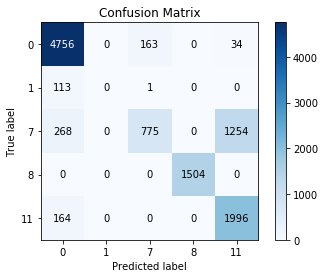

In [721]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [722]:
decision_tree_model = DecisionTreeClassifier(random_state=42).fit(X_train[decoder_columns], y_train)

In [723]:
preds = decision_tree_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.8238121146173377


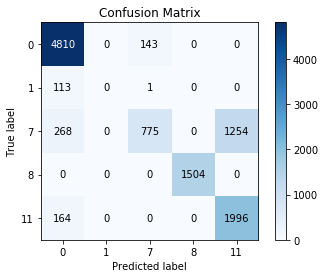

In [724]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [725]:
naive_baiess_model = GaussianNB().fit(X_train[decoder_columns], y_train)

In [726]:
preds = naive_baiess_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  1  7  8 11]
0.4767863619876678


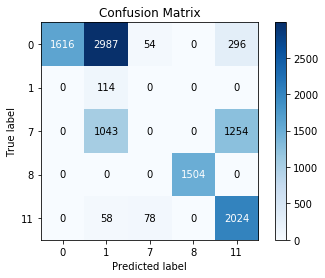

In [727]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [728]:
bernoulli_baiess_model = BernoulliNB().fit(X_train[decoder_columns], y_train)

In [729]:
preds = bernoulli_baiess_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.7210736307580704


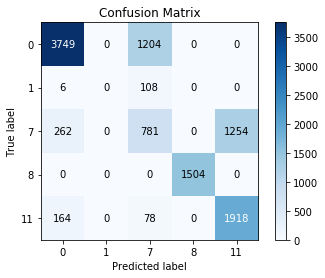

In [730]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [731]:
forest_model = RandomForestClassifier(n_estimators=100, 
                                      max_depth=7, 
                                      min_samples_split = 100,
                                      random_state=42).fit(X_train[decoder_columns], y_train)

In [732]:
preds = forest_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.8238121146173377


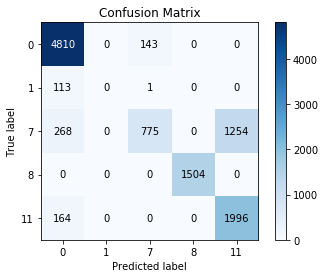

In [733]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [734]:
kneighbours_model = KNeighborsClassifier(n_neighbors=6).fit(X_train[decoder_columns], y_train)

In [735]:
preds = kneighbours_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.7911679361624955


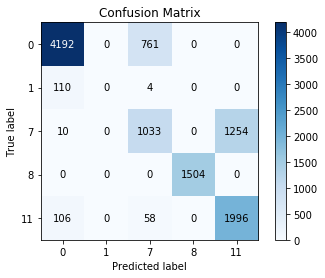

In [736]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [737]:
kneighbours_model_1 = KNeighborsClassifier(n_neighbors=5).fit(X_train[decoder_columns], y_train)

In [738]:
preds = kneighbours_model_1.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.7911679361624955


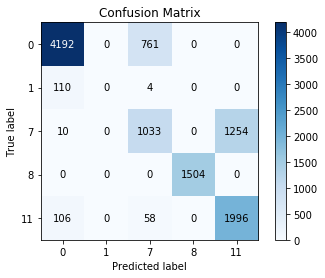

In [739]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [785]:
ada_model = AdaBoostClassifier(n_estimators=30, random_state=42).fit(X_train[decoder_columns], y_train)

In [786]:
ada_model.feature_importances_

array([0.03333333, 0.2       , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.5       , 0.        , 0.        ,
       0.23333333, 0.        , 0.        , 0.        , 0.03333333])

In [787]:
preds = ada_model.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.735582154515778


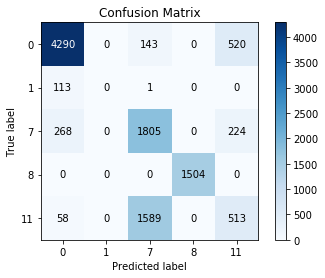

In [788]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [804]:
estimators = [
    ('log_reg', LogisticRegression(random_state=42)),
    ('rf', RandomForestClassifier(n_estimators=10,max_depth=6, random_state=42)),
    ('dt', DecisionTreeClassifier(random_state=42)),
    #('gnb', GaussianNB()),
    #('knn6', KNeighborsClassifier(n_neighbors=6)),
    #('knn5', KNeighborsClassifier(n_neighbors=5)),
    #('ada', AdaBoostClassifier(n_estimators=35, random_state=42)),
    #('ber', BernoulliNB())
]

In [805]:
clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

In [806]:
clf.fit(X_train[decoder_columns], y_train)

/home/anna/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/home/anna/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#

StackingClassifier(cv=None,
                   estimators=[('log_reg',
                                LogisticRegression(C=1.0, class_weight=None,
                                                   dual=False,
                                                   fit_intercept=True,
                                                   intercept_scaling=1,
                                                   l1_ratio=None, max_iter=100,
                                                   multi_class='auto',
                                                   n_jobs=None, penalty='l2',
                                                   random_state=42,
                                                   solver='lbfgs', tol=0.0001,
                                                   verbose=0,
                                                   warm_start=False)),
                               ('rf',
                                RandomForestClassifier(bootstrap=True,
                            

In [807]:
preds = clf.predict(X_test[decoder_columns])
print(np.unique(preds))
print(accuracy_score(y_test, preds))

[ 0  7  8 11]
0.823721436343852


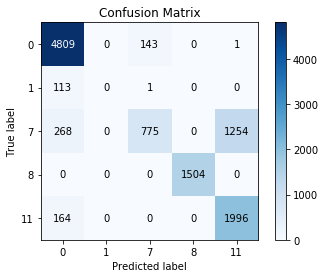

In [808]:
skplt.metrics.plot_confusion_matrix(
    y_test, 
    preds)

In [810]:
import pickle
filename = 'finalized_model.sav'
pickle.dump(log_reg_model, open(filename, 'wb'))